### Import Libraries

In [1]:
import os
import random
import matplotlib.pyplot as plt
import numpy as np
from numpy import fft
from matplotlib import cm
from PIL import Image

from tqdm import tqdm

import pandas as pd
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, roc_curve, roc_auc_score, auc
from sklearn.manifold import TSNE

import cv2
from skimage.feature import local_binary_pattern
from skimage.feature import hog
from sklearn.preprocessing import LabelEncoder
from skimage import io, color, transform
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import label_binarize

from numpy import fft

from tensorflow.keras.applications import VGG16
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input

from tensorflow.keras.preprocessing import image as keras_image
from tensorflow.keras.applications.vgg16 import preprocess_input


### Dataset Path

In [23]:
# Path to the folder containing images
folder_path = "AvalancheDataset\images"

# List of subfolders 
subfolders = ['glide','loose','slab','none']

# List the contents of the glide folder as example
glide_path = os.path.join(folder_path, subfolders[0])
glide_contents = os.listdir(glide_path)

### EDA - Show Some images

Sample Glide Images:


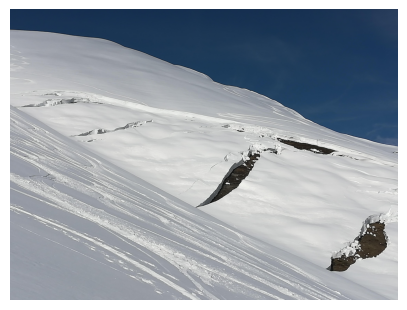

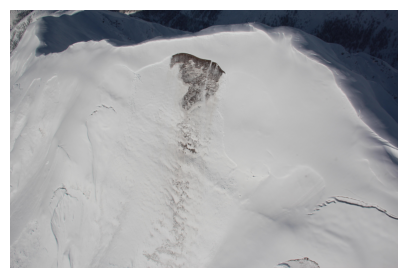

In [12]:
# Sample Images
glide_images = random.sample(os.listdir(glide_path), min(2, len(glide_contents)))
print("Sample Glide Images:")
for image_file in glide_images:
    image_path = os.path.join(glide_path, image_file)
    # Load image
    image = np.array(Image.open(image_path))
    fig, (ax1) = plt.subplots(1, figsize=(5, 5))
    ax1.imshow(image)
    ax1.axis('off')
    plt.show()

### EDA - Color histogram

In [13]:
def plot_color_histogram(image_path, label):
    # Load image
    image = np.array(Image.open(image_path))

    # Calculate histogram for each color channel
    red_hist = np.histogram(image[:,:,0], bins=256, range=(0, 255))[0]
    green_hist = np.histogram(image[:,:,1], bins=256, range=(0, 255))[0]
    blue_hist = np.histogram(image[:,:,2], bins=256, range=(0, 255))[0]

    # Create figure and subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

    # Plot histograms
    ax1.plot(red_hist, color='red', label='Red')
    ax1.plot(green_hist, color='green', label='Green')
    ax1.plot(blue_hist, color='blue', label='Blue')
    ax1.set_xlabel('Intensity')
    ax1.set_ylabel('Frequency')
    ax1.legend()
    ax1.set_title('Color Histogram')

    # Display the image
    ax2.imshow(image)
    ax2.axis('off')
    ax2.set_title('Image')

    plt.suptitle('Color Histogram and Image - ' + label)
    plt.show()


Color histograms and images for images in glide folder:


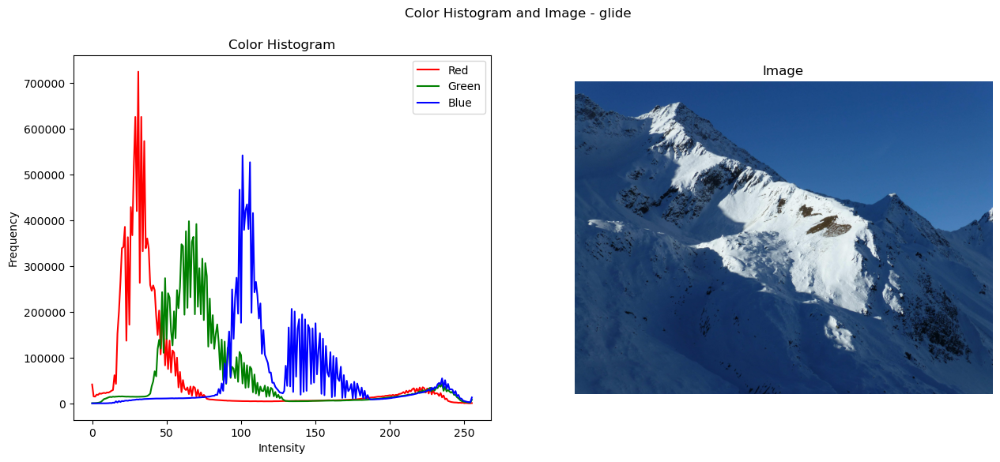

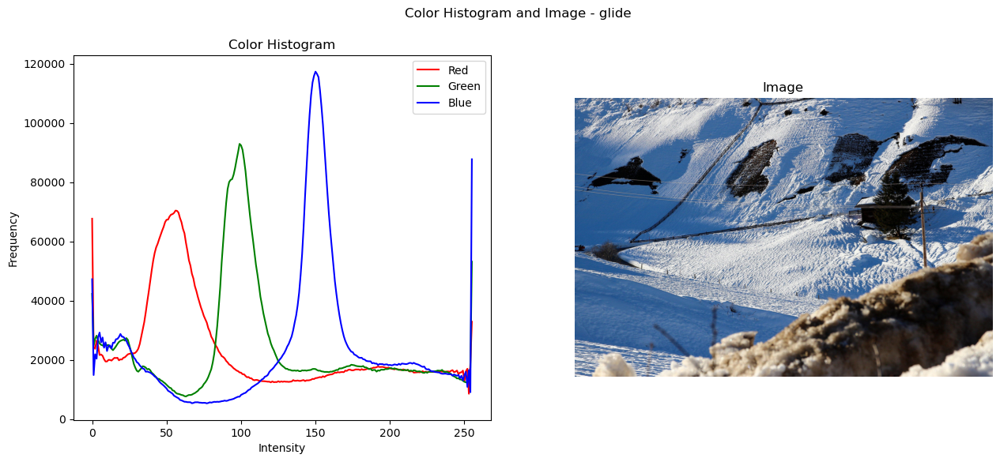


Color histograms and images for images in loose folder:


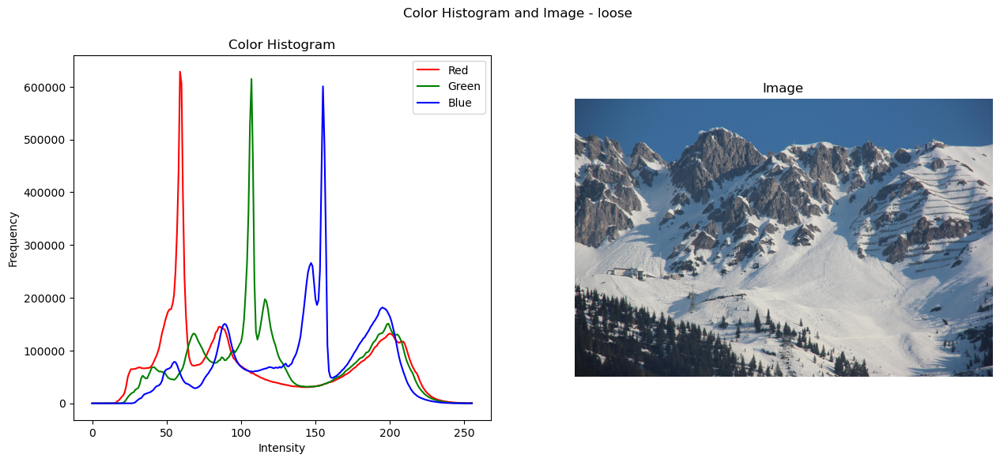

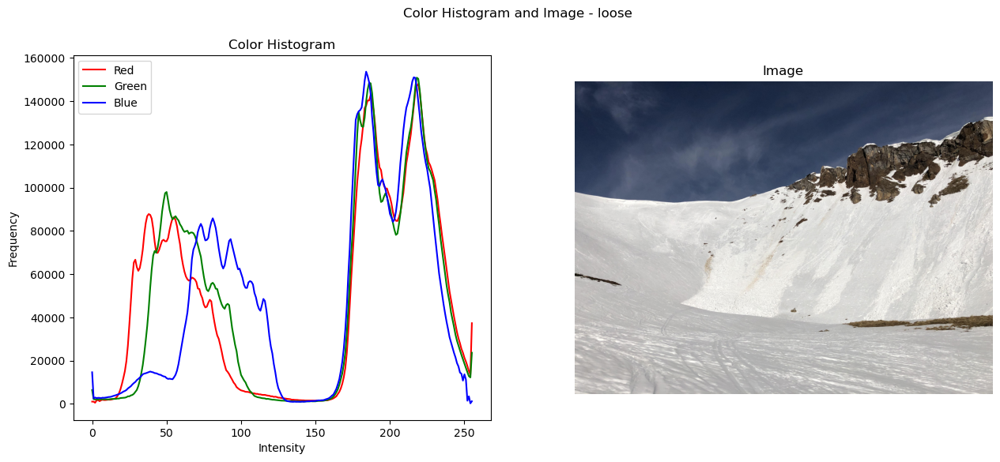


Color histograms and images for images in slab folder:


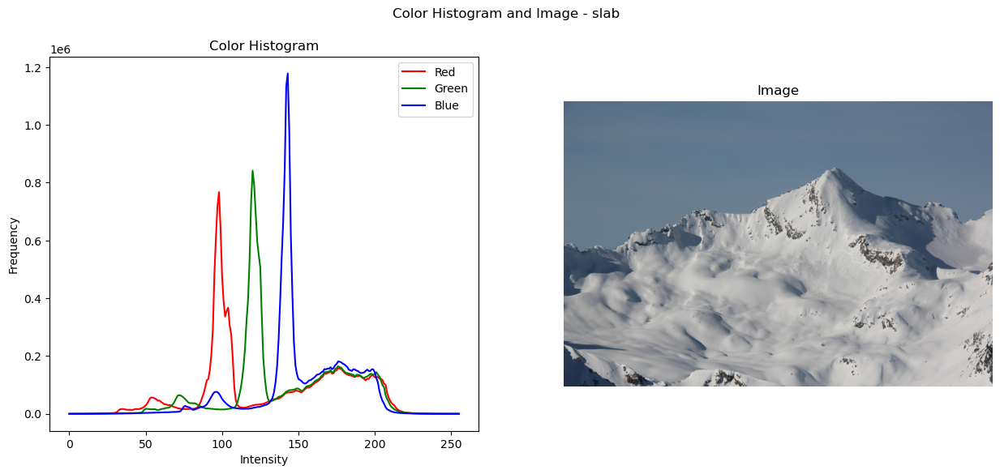

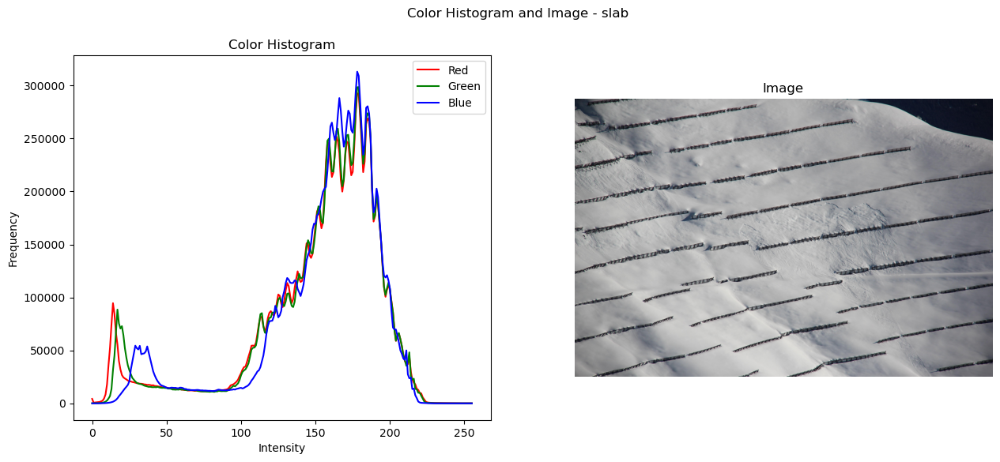


Color histograms and images for images in none folder:


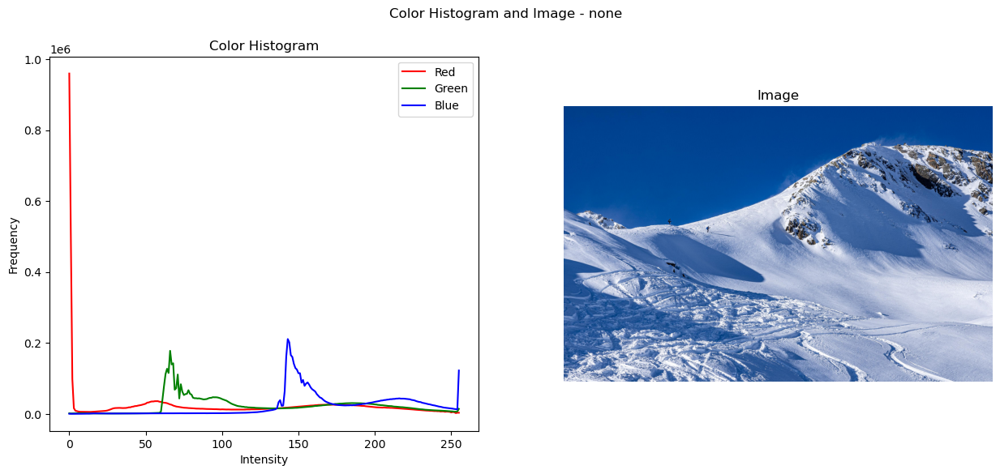

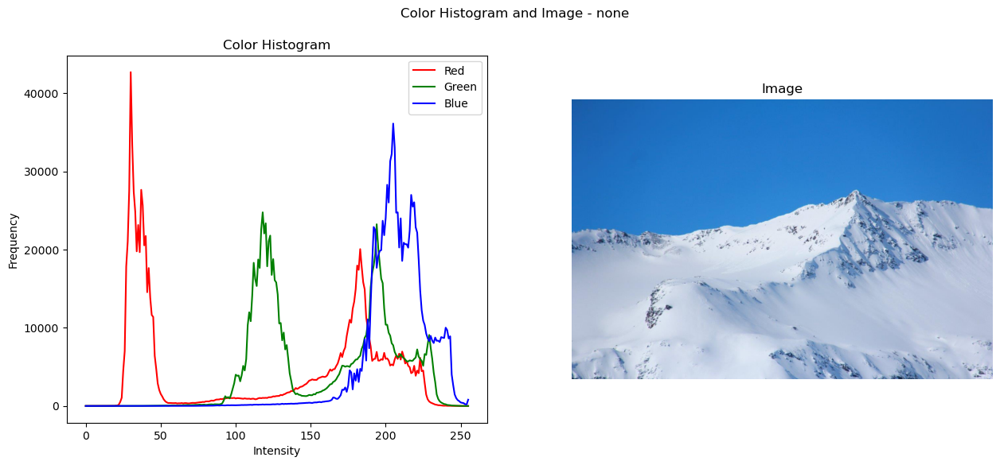

In [14]:
# Select 2 random images from each folders
for subfolder in subfolders:
    subfolder_path = os.path.join(folder_path, subfolder)
    image_files = os.listdir(subfolder_path)
    if len(image_files) >= 2:
        selected_images = random.sample(image_files, 2)

        print(f"\nColor histograms and images for images in {subfolder} folder:")
        for image_file in selected_images:
            image_path = os.path.join(subfolder_path, image_file)
            plot_color_histogram(image_path, subfolder)
    else:
        print(f"\nInsufficient images in {subfolder} folder for sampling.")

### EDA - Fourier Transform

In [18]:
def compute_fft_features(image):
    # Get size of image
    height, width, colors = image.shape
    n_pixels = height*width*colors
    F = fft.fftshift(fft.fft2(image))
    Fmag = np.clip(np.log(np.abs(F)),0,None)
    F_hist, _ = np.histogram(Fmag, bins=50, range=(0,20))
    F_hist = F_hist / n_pixels
    return F_hist

In [19]:
def plot_F_histogram(image_path):
    image = np.array(Image.open(image_path))
    F_hist = compute_fft_features(image)
    
    # Create figure and subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

    # Plot histograms
    ax1.plot(F_hist, color='red', label='Red')
    ax1.set_title('Frequency Histogram')

    # Display the image
    ax2.imshow(image)
    ax2.axis('off')
    ax2.set_title('Image')

    plt.show()


F histograms and images for images in glide folder:


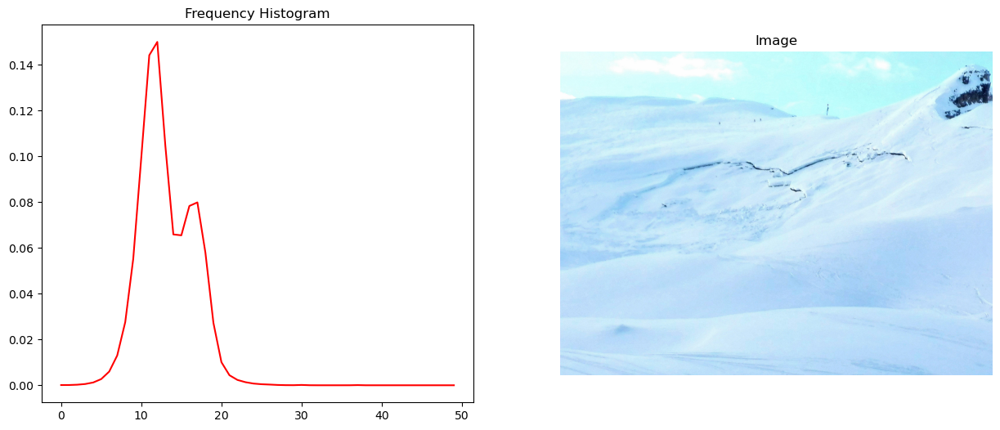

C:\Users\mandy\AppData\Local\Temp\ipykernel_4900\1831935884.py:6: RuntimeWarning: divide by zero encountered in log
  Fmag = np.clip(np.log(np.abs(F)),0,None)


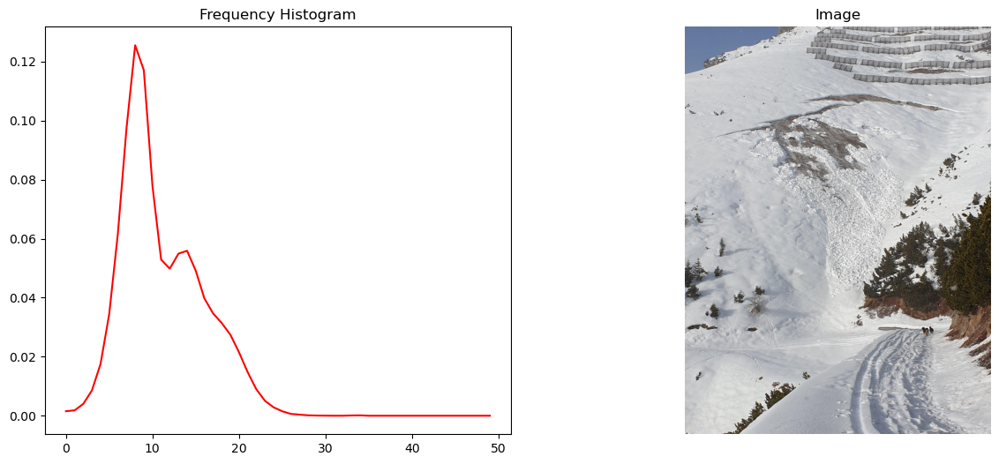


F histograms and images for images in loose folder:


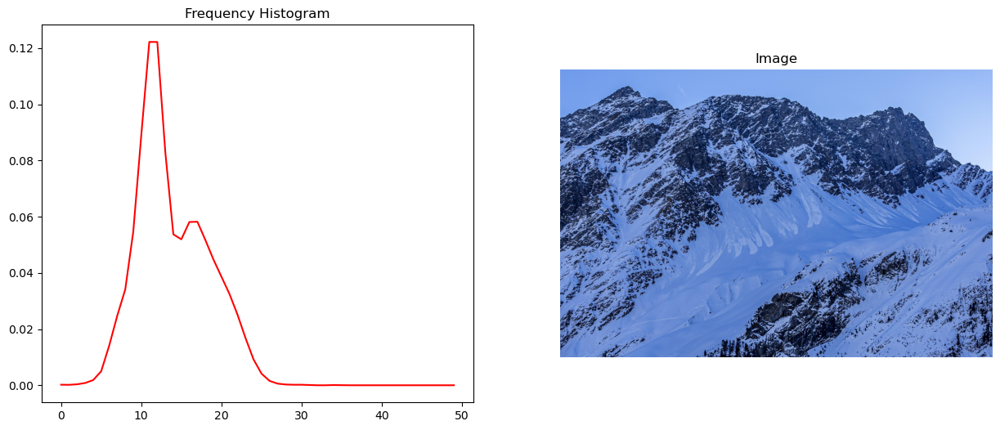

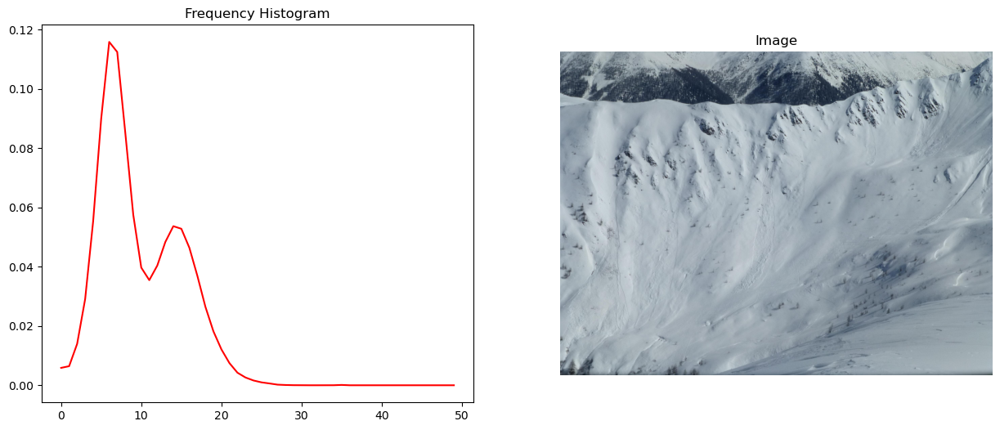


F histograms and images for images in slab folder:


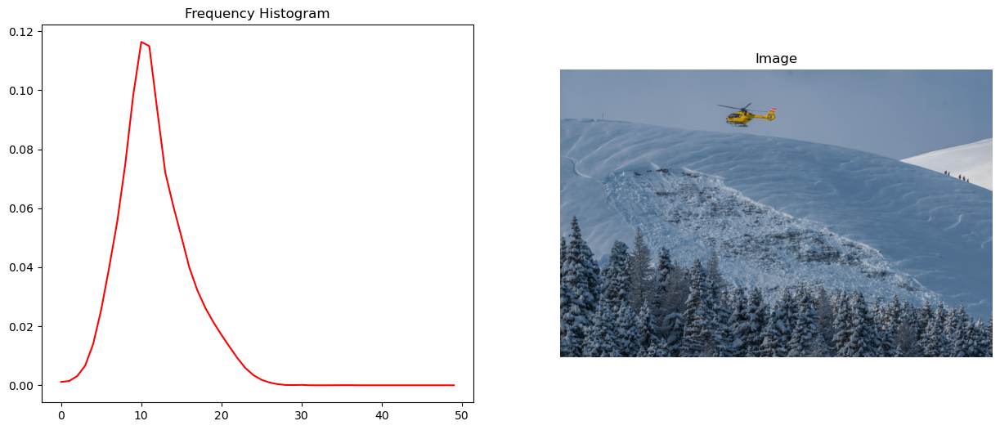

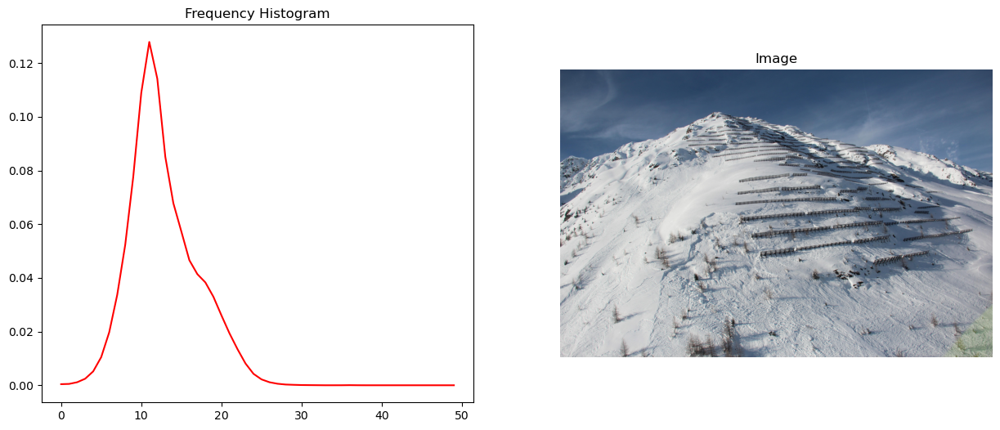


F histograms and images for images in none folder:


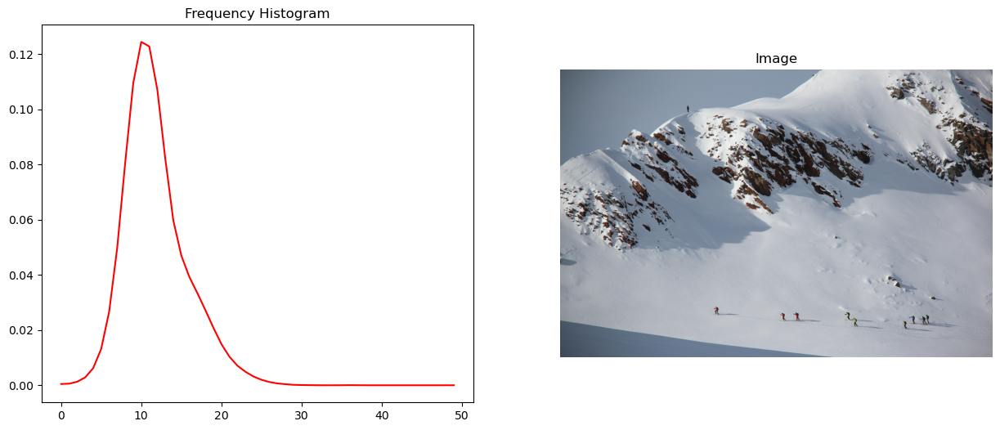

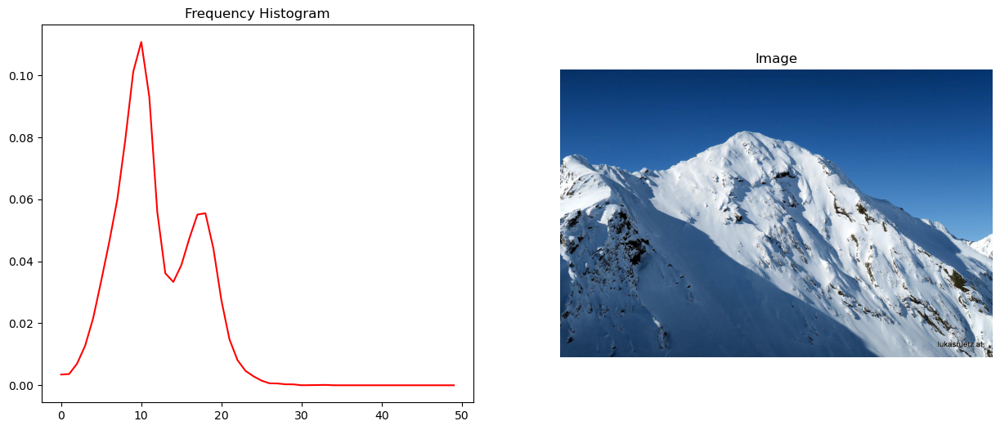

In [20]:
# Select 2 random images from each folders
for subfolder in subfolders:
    subfolder_path = os.path.join(folder_path, subfolder)
    image_files = os.listdir(subfolder_path)
    if len(image_files) >= 2:
        selected_images = random.sample(image_files, 2)

        print(f"\nF histograms and images for images in {subfolder} folder:")
        for image_file in selected_images:
            image_path = os.path.join(subfolder_path, image_file)
            plot_F_histogram(image_path)
    else:
        print(f"\nInsufficient images in {subfolder} folder for sampling.")


## Feature Functions
    # Local Binary Pattern for Textures
    # Hue Saturation Value
    # Red Green Blue
    # FFT features (see function defined during EDA, not repeated here)
    # VGG features

### Texture Analysis: Local Binary Pattern

In [21]:
def compute_lbp_features(image):
    # Check if it's color or grayscale
    if len(image.shape) == 3 and image.shape[2] == 3:
        gray_image = color.rgb2gray(image)
    else:
        gray_image = image
        
    # Compute LBP features
    lbp_image = local_binary_pattern(gray_image, 8, 1, method='uniform')
    hist, _ = np.histogram(lbp_image.ravel(), bins=np.arange(0, 59), range=(0, 58))
    hist = hist.astype("float")
    hist /= (hist.sum() + 1e-7)  # Normalize
    return hist

In [27]:
def plot_lbp_features(image_path):
    image = np.array(Image.open(image_path))
    if len(image.shape) == 3 and image.shape[2] == 3:
        gray_image = color.rgb2gray(image)
    else:
        gray_image = image
    lbp_image = local_binary_pattern(gray_image, 8, 1, method='uniform')
    hist, _ = np.histogram(lbp_image.ravel(), bins=np.arange(0, 15), range=(0, 58))
    hist = hist.astype("float")
    hist /= (hist.sum() + 1e-7)  # Normalize
    
    # Create figure and subplots
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 6))

    # Plot original image
    ax1.imshow(image)
    ax1.set_title('Original Image')

    # Plot lbp image
    ax2.imshow(lbp_image,cmap='gray')
    ax2.axis('off')
    ax2.set_title('LBP Image' )

    # Plot histogram
    ax3.plot(hist)
    ax3.set_title('LBP Histogram')
    plt.show()


LBP features for images in glide folder:


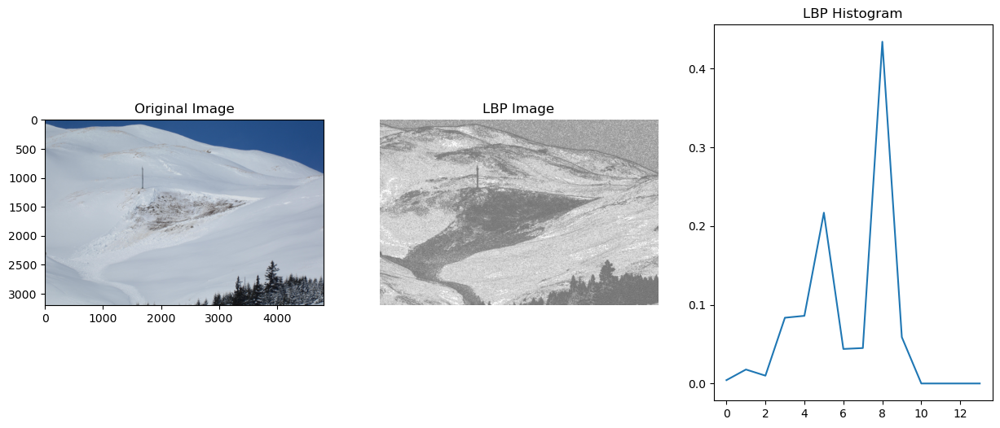

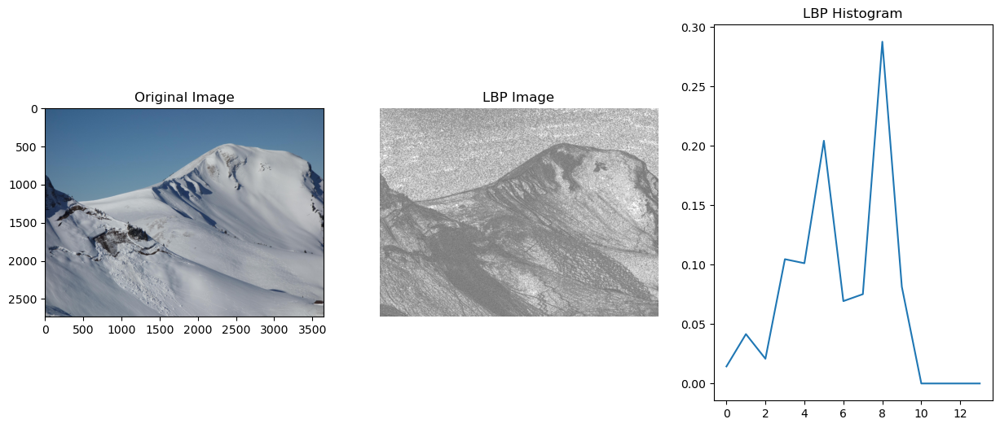


LBP features for images in loose folder:


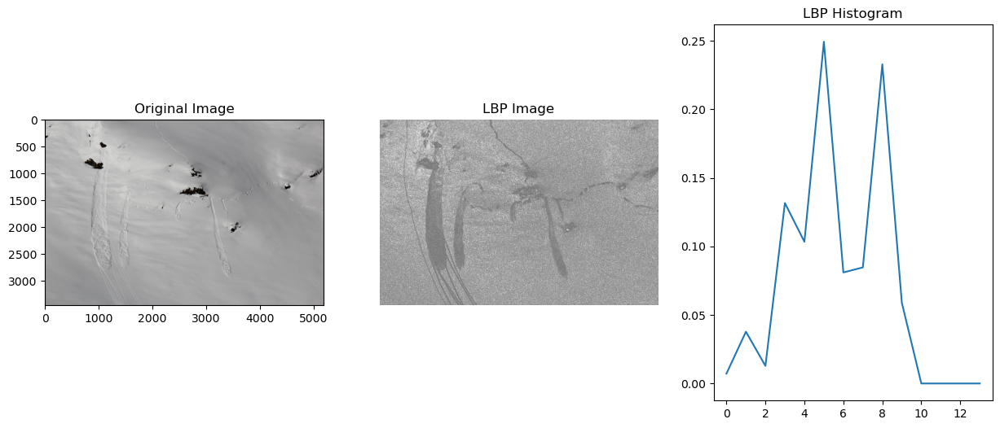

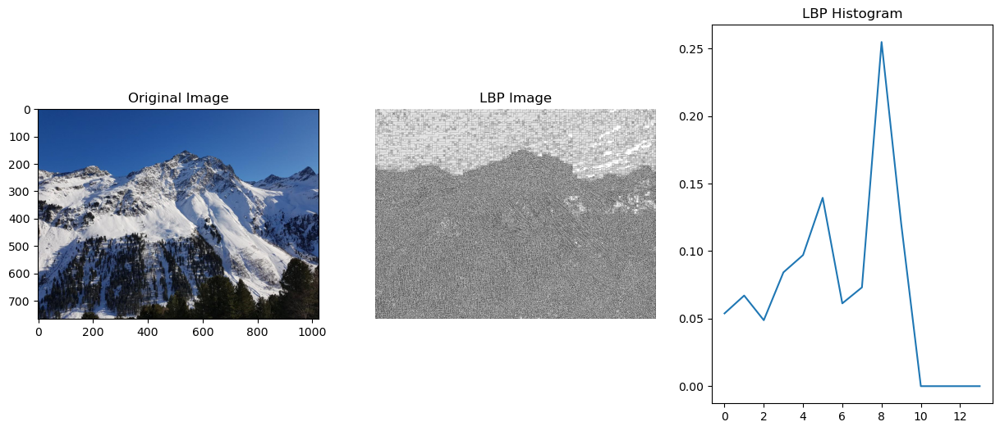


LBP features for images in slab folder:


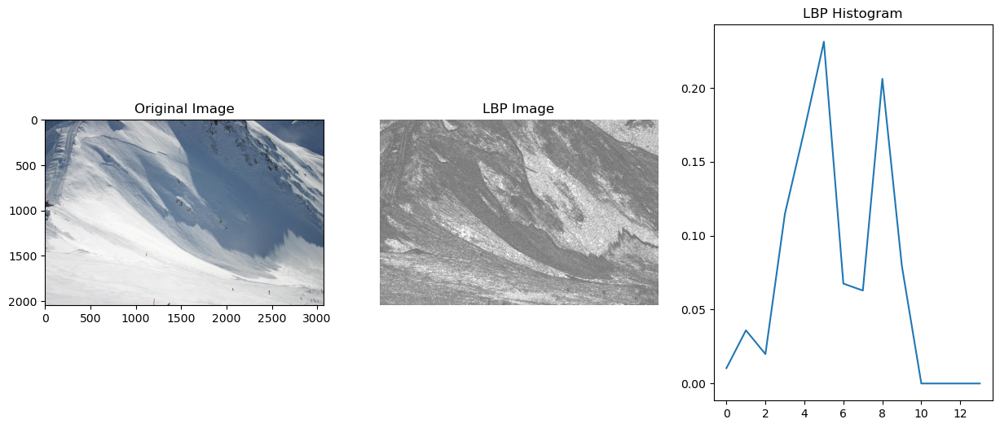

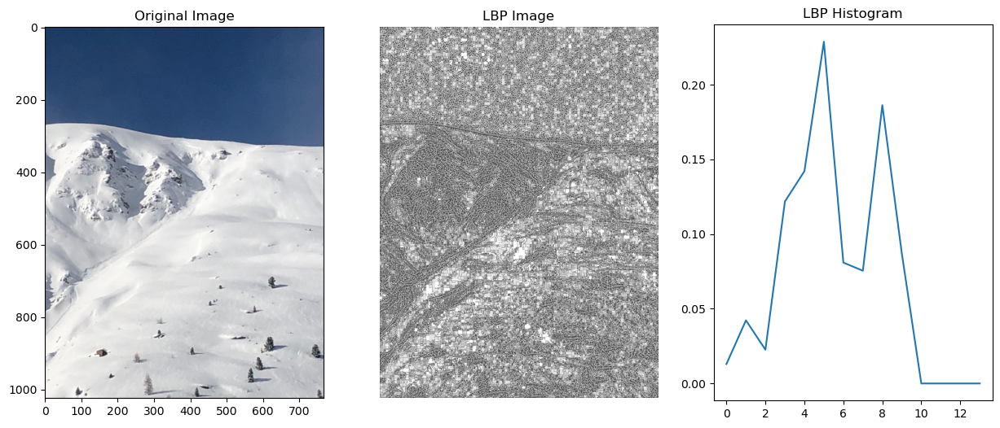


LBP features for images in none folder:


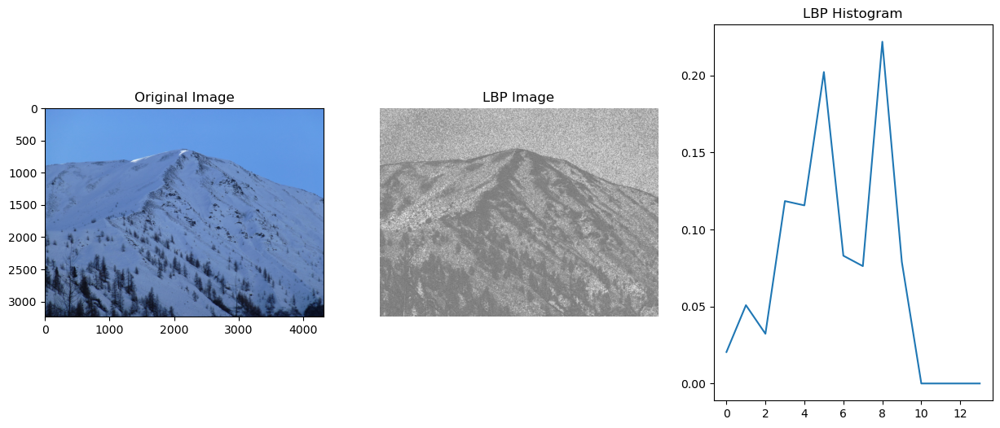

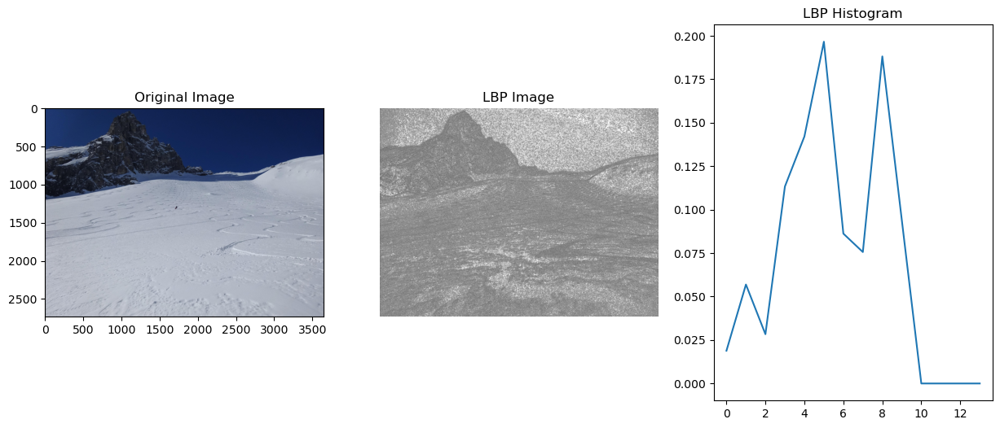

In [28]:
# Select 2 random images from each folder
for subfolder in subfolders:
    subfolder_path = os.path.join(folder_path, subfolder)
    image_files = os.listdir(subfolder_path)
    if len(image_files) >= 2:
        selected_images = random.sample(image_files, 2)

        print(f"\nLBP features for images in {subfolder} folder:")
        for image_file in selected_images:
            image_path = os.path.join(subfolder_path, image_file)
            plot_lbp_features(image_path)
    else:
        print(f"\nInsufficient images in {subfolder} folder for sampling.")


### Color Histogram Features for an Image

In [29]:
def compute_color_histogram_features(image):
    # Get size of image
    height, width, colors = image.shape
    n_pixels = height*width
    
    # Get average of reds, greens, and blues
    reds = np.array([np.sum(image[:,:,0]) / n_pixels / 255])
    greens = np.array([np.sum(image[:,:,1]) / n_pixels / 255])
    blues = np.array([np.sum(image[:,:,2]) / n_pixels / 255])
    
    # Convert the image to HSV
    hsv_image = color.rgb2hsv(image)

    # Compute histograms for each channel (HSV)
    h_hist, _ = np.histogram(hsv_image[:,:,0], bins=256, range=(0, 1)) 
    s_hist, _ = np.histogram(hsv_image[:,:,1], bins=256, range=(0, 1)) 
    v_hist, _ = np.histogram(hsv_image[:,:,2], bins=256, range=(0, 1))

    # Concatenate histograms
    color_hist_features = np.concatenate((h_hist / n_pixels, s_hist / n_pixels, v_hist/ n_pixels, reds, greens, blues))

    return color_hist_features

In [30]:
def plot_hsv_image(image_path):
    image = np.array(Image.open(image_path))
    
    height, width, colors = image.shape
    n_pixels = height*width
    # Convert the image to HSV
    hsv_image = color.rgb2hsv(image)
    
    #h, s, v histograms
    h_hist, _ = np.histogram(hsv_image[:,:,0], bins=256, range=(0, 1)) 
    s_hist, _ = np.histogram(hsv_image[:,:,1], bins=256, range=(0, 1)) 
    v_hist, _ = np.histogram(hsv_image[:,:,2], bins=256, range=(0, 1))
    
    # Create figure and subplots
    fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(30, 6))

    
    
    # Plot original image
    ax1.imshow(image)
    ax1.set_title('Original Image')

    # Plot hsv image
    ax2.imshow(hsv_image[:,:,0],cmap='gray')
    ax2.axis('off')
    ax2.set_title('Hue Image' )
    
    ax3.imshow(hsv_image[:,:,1],cmap='gray')
    ax3.axis('off')
    ax3.set_title('Saturation Image' )
    
    ax4.imshow(hsv_image[:,:,2],cmap='gray')
    ax4.axis('off')
    ax4.set_title('Value Image' )

    # Plot histogram
    ax5.plot(h_hist/ n_pixels, color='red', label='Hue')
    ax5.plot(s_hist/ n_pixels, color='green', label='Saturation')
    ax5.plot(v_hist/ n_pixels, color='blue', label='Value')
    ax5.set_xlabel('Intensity')
    ax5.set_ylabel('Frequency')
    ax5.legend()
    ax5.set_title('HSV Histogram')
    
    plt.show()


HSV features for images in glide folder:


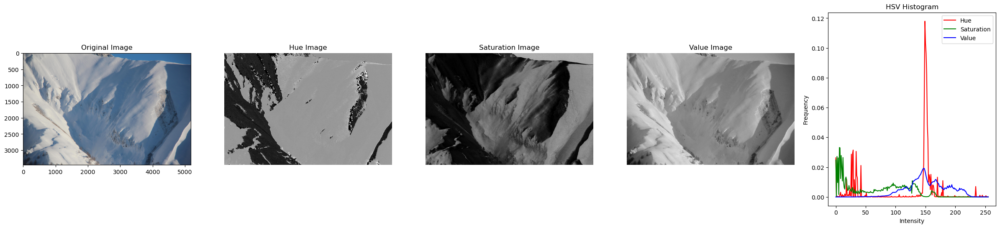

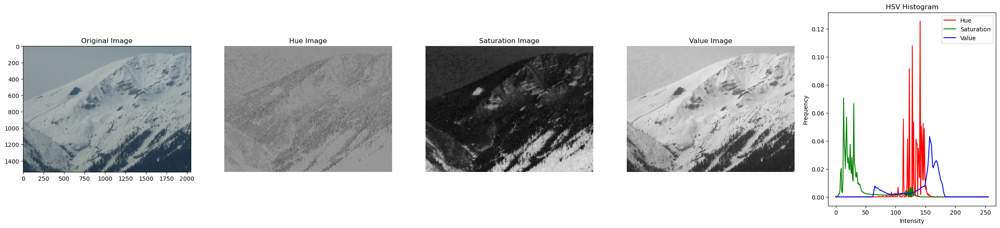


HSV features for images in loose folder:


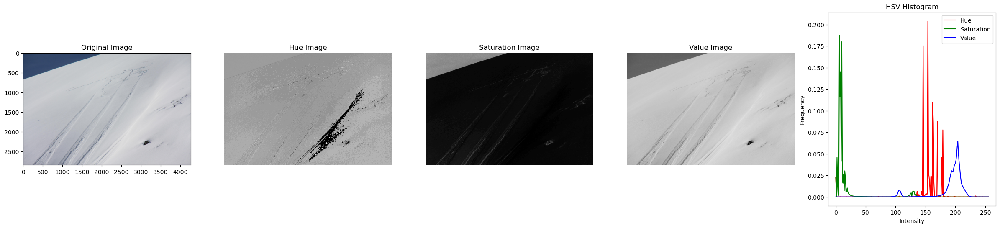

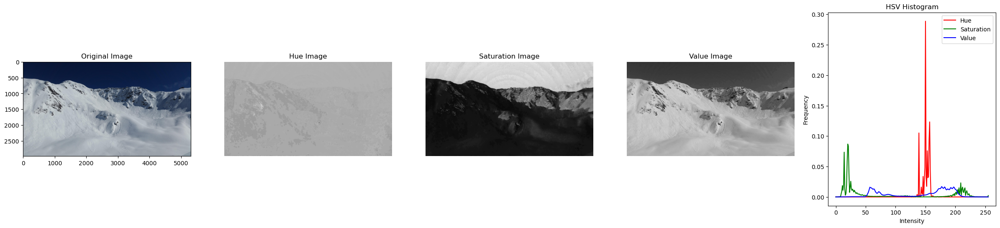


HSV features for images in slab folder:


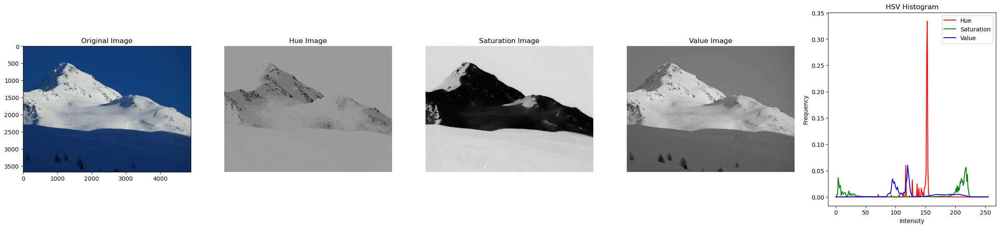

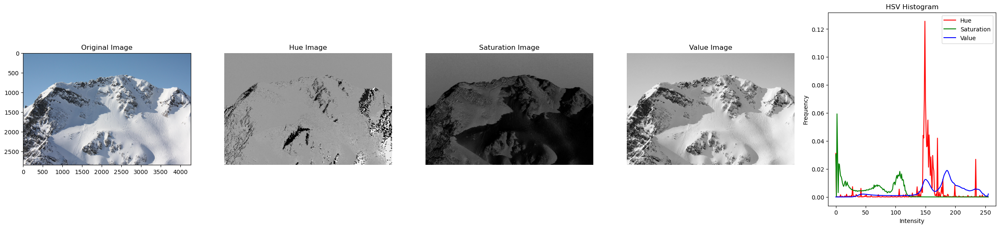


HSV features for images in none folder:


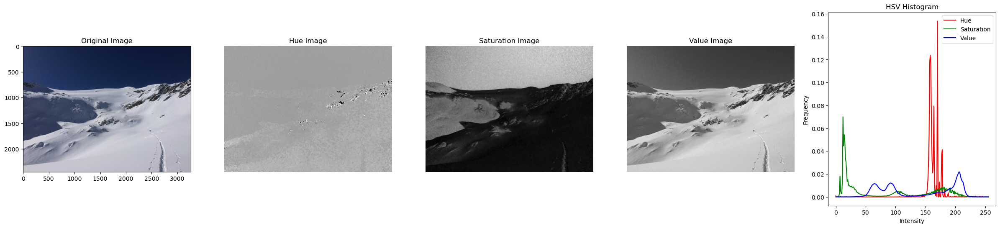

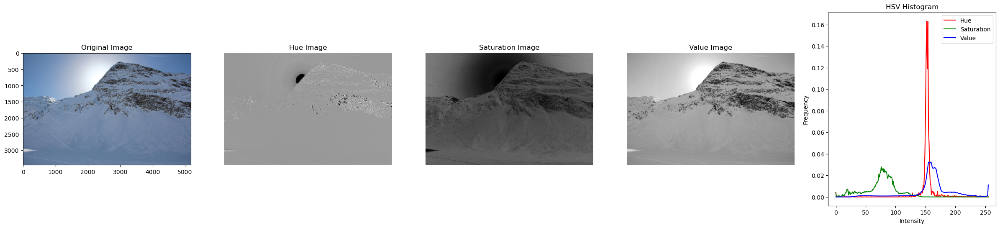

In [31]:
# Select 2 random images from other folders
for subfolder in subfolders:
    subfolder_path = os.path.join(folder_path, subfolder)
    image_files = os.listdir(subfolder_path)
    if len(image_files) >= 2:
        selected_images = random.sample(image_files, 2)

        print(f"\nHSV features for images in {subfolder} folder:")
        for image_file in selected_images:
            image_path = os.path.join(subfolder_path, image_file)
            plot_hsv_image(image_path)
    else:
        print(f"\nInsufficient images in {subfolder} folder for sampling.")


### Extract VGG Model Features

In [48]:
# Load the VGG model
model = VGG16(weights='imagenet', include_top=False)

In [49]:
def read_and_resize_image(img_path, target_size=(224, 224)):
    img = io.imread(img_path)
    img_resized = transform.resize(img, target_size, anti_aliasing=True) # change to input size for the VGG model
    return img_resized

def prepare_image_for_vgg(img_resized):
    # Ensure the image is in the correct format (Height x Width x # of Channels)
    if img_resized.ndim == 2:
        img_resized = np.stack((img_resized,)*3, axis=-1)
    elif img_resized.shape[2] == 4:
        img_resized = img_resized[..., :3]
    
    # Convert the image to a numpy array
    img_array = img_resized * 255  # Scale to 0-255
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)
    return img_array

def extract_vgg_features(img_path):
    resized_img = read_and_resize_image(img_path)
    prepared_img = prepare_image_for_vgg(resized_img)
    features = model.predict(prepared_img)
    return features.flatten()

## Data Cleaning
Run only once!


#### Images are being filtered in this section and moved to another folder once cleaned. 
- RGB images are retained
- RGBA images are converted to RGB
- Other image formats excluded, including grayscale
- Images w/ <300 pixels to a side are excluded
- All included images are resized to 300x300 and moved to yet another set of folders

In [34]:
def resize_image(image, target_size):
    # Get width and height
    width, height = image.size
    
    # Calculate starting points for centered crop
    left = (width - shortest_side) // 2
    top = (height - shortest_side) // 2
    
    #Calculate image side length
    shortest_side = min(width, height)
    
    # Define the crop box
    crop_box = (left, top, left + shortest_side, top + shortest_side)

    # Crop the image
    cropped_image = image.crop(crop_box)
    
    #resize the image
    resized_image = transform.resize(cropped_image, target_size, mode='constant')
    
    return resized_image

In [35]:
# Set minimum size
# for exclusion of images w/ <300 pixels to a side
# for resizing
minimum_size =300

In [40]:
#exclusion_flag to exclude images. 
#Initialize to 0 = 'don't exclude'
exclusion_flag = 0

# Iterate through each avalanche type
for subfolder in subfolders:
    subfolder_path = os.path.join(folder_path, subfolder)
    image_files = os.listdir(subfolder_path)

    n_images = len(image_files)
    
    # Create a folder to store sorted images
    preprocessed_folder_path = os.path.join("preprocessed_images", subfolder)
    if not os.path.exists(preprocessed_folder_path):
        os.makedirs(preprocessed_folder_path)

    # Iterate through each image in the subfolder
    image_counter = 0
    for image_file in tqdm(image_files, desc=subfolder):
        if image_counter == 1500:
            continue
        image_path = os.path.join(subfolder_path, image_file)
        
        # Read the image
        img_info = Image.open(image_path)

        # Only accept RGB or RGBA converted to RGB images
        # Put images in arrays
        if img_info.mode == 'RGB':
            image = np.asarray(img_info)
            height, width, _ = image.shape
        elif img_info.mode == 'RGBA':
            print(f"Image '{image_file}' converted from RGBA to RGB")
            image = img_info.convert('RGB')
            image = np.asarray(image)
            height, width, _ = image.shape
        else:
            print(f"Image '{image_file}' removed because it is {img_info.mode}")
            exclusion_flag=1 

        # Remove images below the minimum size
        minimum_size = 300
        if width < minimum_size or height < minimum_size:
            if exclusion_flag ==0:
                print(f"Image '{image_file}' removed because it is below 300x300")
                exclusion_flag=1

        # Save the sorted image to folder
        if exclusion_flag == 0:
            preprocessed_image_path = os.path.join(preprocessed_folder_path, image_file)
            io.imsave(preprocessed_image_path, image)
            #only count images included in dataset
            image_counter += 1
        
        # Reinitialize exclusion flag
        exclusion_flag = 0

    sorted_image_files = os.listdir(preprocessed_folder_path)
    n_sorted_images = len(sorted_image_files)
    print(f"Before sorting, '{subfolder}' had '{n_images}' images.\n After sorting, it had '{n_sorted_images}' images.")

glide:  69%|██████▊   | 491/716 [02:53<00:43,  5.23it/s]C:\Users\mandy\AppData\Local\Temp\ipykernel_4900\2736694216.py:51: UserWarning: preprocessed_images\glide\2020-09-26 innsbrucker huette (16).jpg is a low contrast image
  io.imsave(preprocessed_image_path, image)
glide: 100%|██████████| 716/716 [04:12<00:00,  2.83it/s]


Before sorting, 'glide' had '716' images.
 After sorting, it had '716' images.


loose: 100%|██████████| 416/416 [02:33<00:00,  2.72it/s]


Before sorting, 'loose' had '416' images.
 After sorting, it had '416' images.


slab:  51%|█████     | 959/1887 [05:19<05:24,  2.86it/s]C:\Users\mandy\AppData\Local\Temp\ipykernel_4900\2736694216.py:51: UserWarning: preprocessed_images\slab\2018-03-09 lech-zuers (2).jpg is a low contrast image
  io.imsave(preprocessed_image_path, image)
slab: 100%|██████████| 1887/1887 [07:59<00:00,  3.94it/s]


Before sorting, 'slab' had '1887' images.
 After sorting, it had '1500' images.


none: 100%|██████████| 1071/1071 [06:15<00:00,  2.86it/s]

Before sorting, 'none' had '1071' images.
 After sorting, it had '1071' images.


#### Save and move folders to final images folder

In [42]:
# Path to the folder containing preprocessed images
folder_path = "preprocessed_images"

# Iterate through each folder
for subfolder in subfolders:
    subfolder_path = os.path.join(folder_path, subfolder)
    image_files = os.listdir(subfolder_path)

    
    # Create a folder to store sorted images
    resized_folder_path = os.path.join("resized_images", subfolder)
    if not os.path.exists(resized_folder_path):
        os.makedirs(resized_folder_path)

    
    # Iterate through each image in the subfolder, limiting the number of examples
    for image_file in tqdm(image_files, desc=subfolder):
        image_path = os.path.join(subfolder_path, image_file)
        image = io.imread(image_path)
        
        # Preprocess the image (resize & crop centered)
        resized_image = resize_image(image, (minimum_size, minimum_size))
        resized_image = (resized_image*255).astype(np.uint8)
        
        # Move image to new folder
        resized_image_path=os.path.join(resized_folder_path, image_file)
        io.imsave(resized_image_path, resized_image)

glide:  69%|██████▊   | 492/716 [09:28<03:16,  1.14it/s]C:\Users\mandy\AppData\Local\Temp\ipykernel_4900\2880066753.py:27: UserWarning: resized_images\glide\2020-09-26 innsbrucker huette (16).jpg is a low contrast image
  io.imsave(resized_image_path, resized_image)
slab:  64%|██████▍   | 959/1500 [17:08<09:55,  1.10s/it]C:\Users\mandy\AppData\Local\Temp\ipykernel_4900\2880066753.py:27: UserWarning: resized_images\slab\2018-03-09 lech-zuers (2).jpg is a low contrast image
  io.imsave(resized_image_path, resized_image)
none: 100%|██████████| 1071/1071 [19:56<00:00,  1.12s/it]


### Extract Features
        # Note the following index locations:
        # Lbp_features: [0:58]
        # HSV features: [58:314], [314:570],[570:826]
        # RBG features: [826:829]
        # FFT features: [829:859] 
        # VGG features: [859:] 25088 features

In [43]:
# Set development flag to 1 for fewer images during development
# or 0 for full image set
dev_flag = 1

In [53]:
# Initialize lists to store features and labels
all_features = []
all_labels = []
min_examples = float('inf')

# Loop through movements; use the number of examples in the smallest folder and select that number as the amount of examples to use for analysis
# i.e., if the smallest art movement had 1500 images and the others had more, only consider 1500 from each folder
# If dev_flag is set to 1, fewer images selected
if dev_flag == 1:
    min_examples = 100
else:
    for subfolder in subfolders:
        subfolder_path = os.path.join(folder_path, movement)
        image_files = os.listdir(subfolder_path)
        num_examples = len(image_files)
        if num_examples < min_examples:
            min_examples = num_examples

# Iterate through each art movement
for subfolder in subfolders:
    subfolder_path = os.path.join(folder_path, subfolder)
    image_files = os.listdir(subfolder_path)
    
    # Iterate through each image in the art movement, limiting the number of examples
    for image_file in tqdm(image_files[:min_examples], desc=subfolder):
        image_path = os.path.join(subfolder_path, image_file)
        image = io.imread(image_path)
        
        # Compute LBP features (texture)
        lbp_features = compute_lbp_features(image)
        
        # Compute color histogram features (color)
        color_hist_features = compute_color_histogram_features(image)
        
        # Compute FFT features
        fft_features = compute_fft_features(image)
        
        # Extract VGG features
        vgg_features = extract_vgg_features(image_path) 
        
        # Concatenate LBP and color histogram features
        combined_features = np.concatenate((lbp_features, color_hist_features, fft_features, vgg_features))
        
        # Append the features to the list
        all_features.append(combined_features)
        
        # Append the label (art movement) to the list
        all_labels.append(subfolder)

glide:   0%|          | 0/100 [00:00<?, ?it/s]

1/1 [==============================] - 0s 65ms/step


C:\Users\mandy\AppData\Local\Temp\ipykernel_4900\1831935884.py:6: RuntimeWarning: divide by zero encountered in log
  Fmag = np.clip(np.log(np.abs(F)),0,None)
glide:   1%|          | 1/100 [00:00<00:41,  2.41it/s]

1/1 [==============================] - 0s 67ms/step


glide:   2%|▏         | 2/100 [00:07<07:21,  4.50s/it]

1/1 [==============================] - 0s 69ms/step


glide:   3%|▎         | 3/100 [00:09<05:00,  3.10s/it]

1/1 [==============================] - 0s 64ms/step


glide:   4%|▍         | 4/100 [00:13<05:45,  3.60s/it]

1/1 [==============================] - 0s 65ms/step


glide:   5%|▌         | 5/100 [00:19<07:13,  4.57s/it]

1/1 [==============================] - 0s 64ms/step


glide:   6%|▌         | 6/100 [00:20<05:08,  3.28s/it]

1/1 [==============================] - 0s 66ms/step


glide:   7%|▋         | 7/100 [00:30<08:34,  5.54s/it]

1/1 [==============================] - 0s 65ms/step


glide:   8%|▊         | 8/100 [00:40<10:43,  7.00s/it]

1/1 [==============================] - 0s 67ms/step


glide:   9%|▉         | 9/100 [00:51<12:08,  8.01s/it]

1/1 [==============================] - 0s 65ms/step


glide:  10%|█         | 10/100 [01:01<12:59,  8.67s/it]

1/1 [==============================] - 0s 65ms/step


glide:  11%|█         | 11/100 [01:11<13:30,  9.11s/it]

1/1 [==============================] - 0s 67ms/step


glide:  12%|█▏        | 12/100 [01:22<14:27,  9.85s/it]

1/1 [==============================] - 0s 67ms/step


glide:  13%|█▎        | 13/100 [01:34<14:57, 10.32s/it]

1/1 [==============================] - 0s 64ms/step


glide:  14%|█▍        | 14/100 [01:41<13:27,  9.38s/it]

1/1 [==============================] - 0s 63ms/step


glide:  15%|█▌        | 15/100 [01:48<12:21,  8.72s/it]

1/1 [==============================] - 0s 64ms/step


glide:  16%|█▌        | 16/100 [01:51<09:45,  6.97s/it]

1/1 [==============================] - 0s 66ms/step


glide:  17%|█▋        | 17/100 [01:58<09:44,  7.04s/it]

1/1 [==============================] - 0s 66ms/step


glide:  18%|█▊        | 18/100 [02:06<09:39,  7.07s/it]

1/1 [==============================] - 0s 67ms/step


glide:  19%|█▉        | 19/100 [02:14<10:11,  7.56s/it]

1/1 [==============================] - 0s 66ms/step


glide:  20%|██        | 20/100 [02:23<10:34,  7.94s/it]

1/1 [==============================] - 0s 68ms/step


glide:  21%|██        | 21/100 [02:32<10:45,  8.17s/it]

1/1 [==============================] - 0s 65ms/step


glide:  22%|██▏       | 22/100 [02:41<10:53,  8.38s/it]

1/1 [==============================] - 0s 65ms/step


glide:  23%|██▎       | 23/100 [02:42<08:14,  6.42s/it]

1/1 [==============================] - 0s 66ms/step


glide:  24%|██▍       | 24/100 [02:47<07:17,  5.76s/it]

1/1 [==============================] - 0s 65ms/step


glide:  25%|██▌       | 25/100 [02:54<07:50,  6.28s/it]

1/1 [==============================] - 0s 63ms/step


glide:  26%|██▌       | 26/100 [03:06<09:38,  7.82s/it]

1/1 [==============================] - 0s 64ms/step


glide:  27%|██▋       | 27/100 [03:07<07:14,  5.95s/it]

1/1 [==============================] - 0s 64ms/step


glide:  28%|██▊       | 28/100 [03:09<05:33,  4.64s/it]

1/1 [==============================] - 0s 64ms/step


glide:  29%|██▉       | 29/100 [03:20<07:54,  6.68s/it]

1/1 [==============================] - 0s 67ms/step


glide:  30%|███       | 30/100 [03:21<05:37,  4.82s/it]

1/1 [==============================] - 0s 65ms/step


glide:  31%|███       | 31/100 [03:32<07:46,  6.76s/it]

1/1 [==============================] - 0s 69ms/step


glide:  32%|███▏      | 32/100 [03:43<09:14,  8.15s/it]

1/1 [==============================] - 0s 65ms/step


glide:  33%|███▎      | 33/100 [03:44<06:28,  5.79s/it]

1/1 [==============================] - 0s 67ms/step


glide:  34%|███▍      | 34/100 [03:55<08:14,  7.49s/it]

1/1 [==============================] - 0s 63ms/step


glide:  35%|███▌      | 35/100 [03:55<05:47,  5.35s/it]

1/1 [==============================] - 0s 65ms/step


glide:  36%|███▌      | 36/100 [03:56<04:08,  3.88s/it]

1/1 [==============================] - 0s 63ms/step


glide:  37%|███▋      | 37/100 [03:57<03:05,  2.95s/it]

1/1 [==============================] - 0s 69ms/step


glide:  38%|███▊      | 38/100 [04:08<05:41,  5.51s/it]

1/1 [==============================] - 0s 67ms/step


glide:  39%|███▉      | 39/100 [04:19<07:20,  7.22s/it]

1/1 [==============================] - 0s 68ms/step


glide:  40%|████      | 40/100 [04:31<08:31,  8.53s/it]

1/1 [==============================] - 0s 64ms/step


glide:  41%|████      | 41/100 [04:36<07:13,  7.35s/it]

1/1 [==============================] - 0s 71ms/step


glide:  42%|████▏     | 42/100 [04:37<05:17,  5.48s/it]

1/1 [==============================] - 0s 66ms/step


glide:  43%|████▎     | 43/100 [04:47<06:36,  6.96s/it]

1/1 [==============================] - 0s 67ms/step


glide:  44%|████▍     | 44/100 [04:57<07:27,  7.98s/it]

1/1 [==============================] - 0s 67ms/step


glide:  45%|████▌     | 45/100 [04:58<05:20,  5.83s/it]

1/1 [==============================] - 0s 63ms/step


glide:  46%|████▌     | 46/100 [04:59<03:48,  4.23s/it]

1/1 [==============================] - 0s 65ms/step


glide:  47%|████▋     | 47/100 [05:10<05:35,  6.32s/it]

1/1 [==============================] - 0s 66ms/step


glide:  48%|████▊     | 48/100 [05:11<04:08,  4.79s/it]

1/1 [==============================] - 0s 65ms/step


glide:  49%|████▉     | 49/100 [05:12<03:05,  3.65s/it]

1/1 [==============================] - 0s 65ms/step


glide:  50%|█████     | 50/100 [05:17<03:19,  3.99s/it]

1/1 [==============================] - 0s 67ms/step


glide:  51%|█████     | 51/100 [05:18<02:29,  3.05s/it]

1/1 [==============================] - 0s 68ms/step


glide:  52%|█████▏    | 52/100 [05:31<04:46,  5.97s/it]

1/1 [==============================] - 0s 64ms/step


glide:  53%|█████▎    | 53/100 [05:33<03:50,  4.90s/it]

1/1 [==============================] - 0s 68ms/step


glide:  54%|█████▍    | 54/100 [05:34<02:46,  3.61s/it]

1/1 [==============================] - 0s 66ms/step


glide:  55%|█████▌    | 55/100 [05:45<04:27,  5.95s/it]

1/1 [==============================] - 0s 66ms/step


glide:  56%|█████▌    | 56/100 [05:56<05:34,  7.60s/it]

1/1 [==============================] - 0s 67ms/step


glide:  57%|█████▋    | 57/100 [06:08<06:16,  8.76s/it]

1/1 [==============================] - 0s 65ms/step


glide:  58%|█████▊    | 58/100 [06:19<06:41,  9.56s/it]

1/1 [==============================] - 0s 66ms/step


glide:  59%|█████▉    | 59/100 [06:31<06:56, 10.15s/it]

1/1 [==============================] - 0s 63ms/step


glide:  60%|██████    | 60/100 [06:31<04:49,  7.24s/it]

1/1 [==============================] - 0s 65ms/step


glide:  61%|██████    | 61/100 [06:40<04:55,  7.59s/it]

1/1 [==============================] - 0s 66ms/step


glide:  62%|██████▏   | 62/100 [06:40<03:26,  5.44s/it]

1/1 [==============================] - 0s 68ms/step


glide:  63%|██████▎   | 63/100 [06:41<02:26,  3.96s/it]

1/1 [==============================] - 0s 67ms/step


glide:  64%|██████▍   | 64/100 [06:50<03:21,  5.60s/it]

1/1 [==============================] - 0s 67ms/step


glide:  65%|██████▌   | 65/100 [06:57<03:34,  6.13s/it]

1/1 [==============================] - 0s 66ms/step


glide:  66%|██████▌   | 66/100 [07:02<03:15,  5.74s/it]

1/1 [==============================] - 0s 65ms/step


glide:  67%|██████▋   | 67/100 [07:13<04:03,  7.38s/it]

1/1 [==============================] - 0s 67ms/step


glide:  68%|██████▊   | 68/100 [07:25<04:32,  8.53s/it]

1/1 [==============================] - 0s 66ms/step


glide:  69%|██████▉   | 69/100 [07:36<04:49,  9.33s/it]

1/1 [==============================] - 0s 66ms/step


glide:  70%|███████   | 70/100 [07:41<03:59,  7.98s/it]

1/1 [==============================] - 0s 64ms/step


glide:  71%|███████   | 71/100 [07:45<03:23,  7.02s/it]

1/1 [==============================] - 0s 65ms/step


glide:  72%|███████▏  | 72/100 [07:47<02:26,  5.24s/it]

1/1 [==============================] - 0s 64ms/step


glide:  73%|███████▎  | 73/100 [07:55<02:48,  6.23s/it]

1/1 [==============================] - 0s 65ms/step


glide:  74%|███████▍  | 74/100 [07:59<02:21,  5.43s/it]

1/1 [==============================] - 0s 65ms/step


glide:  75%|███████▌  | 75/100 [08:07<02:39,  6.37s/it]

1/1 [==============================] - 0s 67ms/step


glide:  76%|███████▌  | 76/100 [08:20<03:20,  8.34s/it]

1/1 [==============================] - 0s 67ms/step


glide:  77%|███████▋  | 77/100 [08:28<03:04,  8.04s/it]

1/1 [==============================] - 0s 68ms/step


glide:  78%|███████▊  | 78/100 [08:32<02:35,  7.07s/it]

1/1 [==============================] - 0s 65ms/step


glide:  79%|███████▉  | 79/100 [08:40<02:30,  7.18s/it]

1/1 [==============================] - 0s 64ms/step


glide:  80%|████████  | 80/100 [08:45<02:09,  6.46s/it]

1/1 [==============================] - 0s 64ms/step


glide:  81%|████████  | 81/100 [08:45<01:30,  4.77s/it]

1/1 [==============================] - 0s 65ms/step


glide:  82%|████████▏ | 82/100 [08:46<01:02,  3.46s/it]

1/1 [==============================] - 0s 64ms/step


glide:  83%|████████▎ | 83/100 [08:54<01:21,  4.82s/it]

1/1 [==============================] - 0s 69ms/step


glide:  84%|████████▍ | 84/100 [09:09<02:08,  8.02s/it]

1/1 [==============================] - 0s 67ms/step


glide:  85%|████████▌ | 85/100 [09:25<02:33, 10.21s/it]

1/1 [==============================] - 0s 66ms/step


glide:  86%|████████▌ | 86/100 [09:25<01:41,  7.22s/it]

1/1 [==============================] - 0s 65ms/step


glide:  87%|████████▋ | 87/100 [09:26<01:10,  5.39s/it]

1/1 [==============================] - 0s 68ms/step


glide:  88%|████████▊ | 88/100 [09:35<01:19,  6.59s/it]

1/1 [==============================] - 0s 66ms/step


glide:  89%|████████▉ | 89/100 [09:45<01:21,  7.44s/it]

1/1 [==============================] - 0s 65ms/step


glide:  90%|█████████ | 90/100 [09:54<01:20,  8.02s/it]

1/1 [==============================] - 0s 65ms/step


glide:  91%|█████████ | 91/100 [10:03<01:15,  8.41s/it]

1/1 [==============================] - 0s 65ms/step


glide:  92%|█████████▏| 92/100 [10:13<01:09,  8.70s/it]

1/1 [==============================] - 0s 67ms/step


glide:  93%|█████████▎| 93/100 [10:14<00:45,  6.43s/it]

1/1 [==============================] - 0s 63ms/step


glide:  94%|█████████▍| 94/100 [10:15<00:29,  4.84s/it]

1/1 [==============================] - 0s 66ms/step


glide:  95%|█████████▌| 95/100 [10:16<00:18,  3.66s/it]

1/1 [==============================] - 0s 63ms/step


glide:  96%|█████████▌| 96/100 [10:16<00:10,  2.62s/it]

1/1 [==============================] - 0s 66ms/step


glide:  97%|█████████▋| 97/100 [10:16<00:05,  1.91s/it]

1/1 [==============================] - 0s 69ms/step


glide:  98%|█████████▊| 98/100 [10:17<00:03,  1.61s/it]

1/1 [==============================] - 0s 63ms/step


glide:  99%|█████████▉| 99/100 [10:25<00:03,  3.30s/it]

1/1 [==============================] - 0s 65ms/step


loose:   0%|          | 0/100 [00:00<?, ?it/s]

1/1 [==============================] - 0s 65ms/step


loose:   1%|          | 1/100 [00:04<08:03,  4.88s/it]

1/1 [==============================] - 0s 67ms/step


loose:   2%|▏         | 2/100 [00:12<10:12,  6.25s/it]

1/1 [==============================] - 0s 68ms/step


loose:   3%|▎         | 3/100 [00:13<06:54,  4.27s/it]

1/1 [==============================] - 0s 63ms/step


loose:   4%|▍         | 4/100 [00:15<04:53,  3.06s/it]

1/1 [==============================] - 0s 66ms/step


loose:   5%|▌         | 5/100 [00:23<07:56,  5.02s/it]

1/1 [==============================] - 0s 65ms/step


loose:   6%|▌         | 6/100 [00:25<06:11,  3.96s/it]

1/1 [==============================] - 0s 66ms/step


loose:   7%|▋         | 7/100 [00:37<10:00,  6.46s/it]

1/1 [==============================] - 0s 68ms/step


loose:   8%|▊         | 8/100 [00:41<08:50,  5.77s/it]

1/1 [==============================] - 0s 66ms/step


loose:   9%|▉         | 9/100 [00:52<11:20,  7.48s/it]

1/1 [==============================] - 0s 65ms/step


loose:  10%|█         | 10/100 [01:00<11:16,  7.52s/it]

1/1 [==============================] - 0s 66ms/step


loose:  11%|█         | 11/100 [01:01<08:28,  5.71s/it]

1/1 [==============================] - 0s 65ms/step


loose:  12%|█▏        | 12/100 [01:03<06:32,  4.46s/it]

1/1 [==============================] - 0s 69ms/step


loose:  13%|█▎        | 13/100 [01:08<06:37,  4.57s/it]

1/1 [==============================] - 0s 68ms/step


loose:  14%|█▍        | 14/100 [01:09<05:15,  3.67s/it]

1/1 [==============================] - 0s 64ms/step


loose:  15%|█▌        | 15/100 [01:11<04:18,  3.04s/it]

1/1 [==============================] - 0s 64ms/step


loose:  16%|█▌        | 16/100 [01:13<03:38,  2.60s/it]

1/1 [==============================] - 0s 66ms/step


loose:  17%|█▋        | 17/100 [01:20<05:31,  4.00s/it]

1/1 [==============================] - 0s 67ms/step


loose:  18%|█▊        | 18/100 [01:27<06:46,  4.95s/it]

1/1 [==============================] - 0s 64ms/step


loose:  19%|█▉        | 19/100 [01:31<06:23,  4.73s/it]

1/1 [==============================] - 0s 66ms/step


loose:  20%|██        | 20/100 [01:33<05:03,  3.79s/it]

1/1 [==============================] - 0s 66ms/step


loose:  21%|██        | 21/100 [01:44<07:54,  6.01s/it]

1/1 [==============================] - 0s 64ms/step


loose:  22%|██▏       | 22/100 [01:46<06:04,  4.68s/it]

1/1 [==============================] - 0s 67ms/step


loose:  23%|██▎       | 23/100 [01:57<08:31,  6.65s/it]

1/1 [==============================] - 0s 68ms/step


loose:  24%|██▍       | 24/100 [02:08<10:12,  8.07s/it]

1/1 [==============================] - 0s 64ms/step


loose:  25%|██▌       | 25/100 [02:20<11:18,  9.05s/it]

1/1 [==============================] - 0s 66ms/step


loose:  26%|██▌       | 26/100 [02:23<08:54,  7.23s/it]

1/1 [==============================] - 0s 67ms/step


loose:  27%|██▋       | 27/100 [02:34<10:25,  8.56s/it]

1/1 [==============================] - 0s 67ms/step


loose:  28%|██▊       | 28/100 [02:43<10:16,  8.56s/it]

1/1 [==============================] - 0s 70ms/step


loose:  29%|██▉       | 29/100 [02:44<07:40,  6.48s/it]

1/1 [==============================] - 0s 64ms/step


loose:  30%|███       | 30/100 [02:45<05:32,  4.75s/it]

1/1 [==============================] - 0s 67ms/step


loose:  31%|███       | 31/100 [02:47<04:22,  3.80s/it]

1/1 [==============================] - 0s 65ms/step


loose:  32%|███▏      | 32/100 [02:58<06:55,  6.11s/it]

1/1 [==============================] - 0s 64ms/step


loose:  33%|███▎      | 33/100 [03:00<05:17,  4.74s/it]

1/1 [==============================] - 0s 64ms/step


loose:  34%|███▍      | 34/100 [03:03<04:36,  4.19s/it]

1/1 [==============================] - 0s 67ms/step


loose:  35%|███▌      | 35/100 [03:14<06:48,  6.29s/it]

1/1 [==============================] - 0s 68ms/step


loose:  36%|███▌      | 36/100 [03:25<08:22,  7.85s/it]

1/1 [==============================] - 0s 65ms/step


loose:  37%|███▋      | 37/100 [03:37<09:19,  8.88s/it]

1/1 [==============================] - 0s 65ms/step


loose:  38%|███▊      | 38/100 [03:40<07:20,  7.11s/it]

1/1 [==============================] - 0s 65ms/step


loose:  39%|███▉      | 39/100 [03:50<08:15,  8.13s/it]

1/1 [==============================] - 0s 68ms/step


loose:  40%|████      | 40/100 [03:53<06:34,  6.57s/it]

1/1 [==============================] - 0s 66ms/step


loose:  41%|████      | 41/100 [04:05<07:54,  8.04s/it]

1/1 [==============================] - 0s 66ms/step


loose:  42%|████▏     | 42/100 [04:07<06:16,  6.50s/it]

1/1 [==============================] - 0s 65ms/step


loose:  43%|████▎     | 43/100 [04:16<06:44,  7.10s/it]

1/1 [==============================] - 0s 66ms/step


loose:  44%|████▍     | 44/100 [04:27<07:47,  8.35s/it]

1/1 [==============================] - 0s 68ms/step


loose:  45%|████▌     | 45/100 [04:30<06:00,  6.56s/it]

1/1 [==============================] - 0s 65ms/step


loose:  46%|████▌     | 46/100 [04:32<04:47,  5.33s/it]

1/1 [==============================] - 0s 66ms/step


loose:  47%|████▋     | 47/100 [04:37<04:34,  5.19s/it]

1/1 [==============================] - 0s 65ms/step


loose:  48%|████▊     | 48/100 [04:38<03:33,  4.10s/it]

1/1 [==============================] - 0s 66ms/step


loose:  49%|████▉     | 49/100 [04:50<05:20,  6.29s/it]

1/1 [==============================] - 0s 72ms/step


loose:  50%|█████     | 50/100 [05:00<06:14,  7.49s/it]

1/1 [==============================] - 0s 67ms/step


loose:  51%|█████     | 51/100 [05:11<06:51,  8.41s/it]

1/1 [==============================] - 0s 67ms/step


loose:  52%|█████▏    | 52/100 [05:15<05:43,  7.15s/it]

1/1 [==============================] - 0s 68ms/step


loose:  53%|█████▎    | 53/100 [05:26<06:36,  8.44s/it]

1/1 [==============================] - 0s 67ms/step


loose:  54%|█████▍    | 54/100 [05:35<06:35,  8.61s/it]

1/1 [==============================] - 0s 65ms/step


loose:  55%|█████▌    | 55/100 [05:38<05:12,  6.95s/it]

1/1 [==============================] - 0s 70ms/step


loose:  56%|█████▌    | 56/100 [05:40<03:56,  5.37s/it]

1/1 [==============================] - 0s 67ms/step


loose:  57%|█████▋    | 57/100 [05:52<05:15,  7.35s/it]

1/1 [==============================] - 0s 69ms/step


loose:  58%|█████▊    | 58/100 [05:53<03:41,  5.27s/it]

1/1 [==============================] - 0s 69ms/step


loose:  59%|█████▉    | 59/100 [05:54<02:50,  4.17s/it]

1/1 [==============================] - 0s 66ms/step


loose:  60%|██████    | 60/100 [06:05<04:09,  6.24s/it]

1/1 [==============================] - 0s 71ms/step


loose:  61%|██████    | 61/100 [06:16<05:01,  7.72s/it]

1/1 [==============================] - 0s 66ms/step


loose:  62%|██████▏   | 62/100 [06:27<05:32,  8.75s/it]

1/1 [==============================] - 0s 69ms/step


loose:  63%|██████▎   | 63/100 [06:39<05:51,  9.51s/it]

1/1 [==============================] - 0s 67ms/step


loose:  64%|██████▍   | 64/100 [06:46<05:18,  8.86s/it]

1/1 [==============================] - 0s 75ms/step


loose:  65%|██████▌   | 65/100 [06:48<03:53,  6.68s/it]

1/1 [==============================] - 0s 65ms/step


loose:  66%|██████▌   | 66/100 [07:00<04:49,  8.51s/it]

1/1 [==============================] - 0s 68ms/step


loose:  67%|██████▋   | 67/100 [07:02<03:32,  6.43s/it]

1/1 [==============================] - 0s 65ms/step


loose:  68%|██████▊   | 68/100 [07:04<02:38,  4.97s/it]

1/1 [==============================] - 0s 70ms/step


loose:  69%|██████▉   | 69/100 [07:05<02:02,  3.95s/it]

1/1 [==============================] - 0s 67ms/step


loose:  70%|███████   | 70/100 [07:07<01:37,  3.24s/it]

1/1 [==============================] - 0s 63ms/step


loose:  71%|███████   | 71/100 [07:08<01:19,  2.74s/it]

1/1 [==============================] - 0s 66ms/step


loose:  72%|███████▏  | 72/100 [07:11<01:14,  2.64s/it]

1/1 [==============================] - 0s 66ms/step


loose:  73%|███████▎  | 73/100 [07:13<01:09,  2.56s/it]

1/1 [==============================] - 0s 66ms/step


loose:  74%|███████▍  | 74/100 [07:24<02:15,  5.20s/it]

1/1 [==============================] - 0s 67ms/step


loose:  75%|███████▌  | 75/100 [07:36<02:58,  7.12s/it]

1/1 [==============================] - 0s 66ms/step


loose:  76%|███████▌  | 76/100 [07:47<03:19,  8.31s/it]

1/1 [==============================] - 0s 66ms/step


loose:  77%|███████▋  | 77/100 [07:54<03:03,  7.99s/it]

1/1 [==============================] - 0s 66ms/step


loose:  78%|███████▊  | 78/100 [08:06<03:17,  8.98s/it]

1/1 [==============================] - 0s 68ms/step


loose:  79%|███████▉  | 79/100 [08:14<03:02,  8.67s/it]

1/1 [==============================] - 0s 68ms/step


loose:  80%|████████  | 80/100 [08:25<03:08,  9.45s/it]

1/1 [==============================] - 0s 65ms/step


loose:  81%|████████  | 81/100 [08:28<02:25,  7.67s/it]

1/1 [==============================] - 0s 64ms/step


loose:  82%|████████▏ | 82/100 [08:29<01:39,  5.52s/it]

1/1 [==============================] - 0s 64ms/step


loose:  83%|████████▎ | 83/100 [08:37<01:49,  6.41s/it]

1/1 [==============================] - 0s 65ms/step


loose:  84%|████████▍ | 84/100 [08:49<02:06,  7.90s/it]

1/1 [==============================] - 0s 67ms/step


loose:  85%|████████▌ | 85/100 [08:50<01:26,  5.76s/it]

1/1 [==============================] - 0s 66ms/step


loose:  86%|████████▌ | 86/100 [09:01<01:42,  7.36s/it]

1/1 [==============================] - 0s 66ms/step


loose:  87%|████████▋ | 87/100 [09:07<01:30,  6.93s/it]

1/1 [==============================] - 0s 70ms/step


loose:  88%|████████▊ | 88/100 [09:18<01:38,  8.23s/it]

1/1 [==============================] - 0s 66ms/step


loose:  89%|████████▉ | 89/100 [09:19<01:05,  5.97s/it]

1/1 [==============================] - 0s 68ms/step


loose:  90%|█████████ | 90/100 [09:20<00:47,  4.71s/it]

1/1 [==============================] - 0s 67ms/step


loose:  91%|█████████ | 91/100 [09:31<00:59,  6.65s/it]

1/1 [==============================] - 0s 65ms/step


loose:  92%|█████████▏| 92/100 [09:42<01:01,  7.66s/it]

1/1 [==============================] - 0s 66ms/step


loose:  93%|█████████▎| 93/100 [09:54<01:04,  9.19s/it]

1/1 [==============================] - 0s 65ms/step


loose:  94%|█████████▍| 94/100 [09:58<00:44,  7.47s/it]

1/1 [==============================] - 0s 67ms/step


loose:  95%|█████████▌| 95/100 [10:01<00:31,  6.28s/it]

1/1 [==============================] - 0s 69ms/step


loose:  96%|█████████▌| 96/100 [10:13<00:31,  7.87s/it]

1/1 [==============================] - 0s 66ms/step


loose:  97%|█████████▋| 97/100 [10:13<00:16,  5.65s/it]

1/1 [==============================] - 0s 66ms/step


loose:  98%|█████████▊| 98/100 [10:14<00:08,  4.09s/it]

1/1 [==============================] - 0s 65ms/step


loose:  99%|█████████▉| 99/100 [10:21<00:05,  5.04s/it]

1/1 [==============================] - 0s 64ms/step


slab:   0%|          | 0/100 [00:00<?, ?it/s]

1/1 [==============================] - 0s 64ms/step


slab:   1%|          | 1/100 [00:02<03:54,  2.37s/it]

1/1 [==============================] - 0s 67ms/step


slab:   2%|▏         | 2/100 [00:03<02:41,  1.65s/it]

1/1 [==============================] - 0s 63ms/step


slab:   3%|▎         | 3/100 [00:04<02:30,  1.55s/it]

1/1 [==============================] - 0s 65ms/step


slab:   4%|▍         | 4/100 [00:05<02:01,  1.27s/it]

1/1 [==============================] - 0s 64ms/step


slab:   5%|▌         | 5/100 [00:06<01:52,  1.18s/it]

1/1 [==============================] - 0s 65ms/step


slab:   6%|▌         | 6/100 [00:10<03:25,  2.19s/it]

1/1 [==============================] - 0s 66ms/step


slab:   7%|▋         | 7/100 [00:13<03:47,  2.44s/it]

1/1 [==============================] - 0s 66ms/step


slab:   8%|▊         | 8/100 [00:14<02:57,  1.93s/it]

1/1 [==============================] - 0s 66ms/step


slab:   9%|▉         | 9/100 [00:15<02:13,  1.47s/it]

1/1 [==============================] - 0s 65ms/step


slab:  10%|█         | 10/100 [00:18<02:53,  1.93s/it]

1/1 [==============================] - 0s 66ms/step


slab:  11%|█         | 11/100 [00:21<03:19,  2.24s/it]

1/1 [==============================] - 0s 66ms/step


slab:  12%|█▏        | 12/100 [00:24<03:36,  2.46s/it]

1/1 [==============================] - 0s 66ms/step


slab:  13%|█▎        | 13/100 [00:31<05:37,  3.88s/it]

1/1 [==============================] - 0s 64ms/step


slab:  14%|█▍        | 14/100 [00:34<05:24,  3.78s/it]

1/1 [==============================] - 0s 63ms/step


slab:  15%|█▌        | 15/100 [00:35<03:50,  2.71s/it]

1/1 [==============================] - 0s 65ms/step


slab:  16%|█▌        | 16/100 [00:43<06:11,  4.43s/it]

1/1 [==============================] - 0s 64ms/step


slab:  17%|█▋        | 17/100 [00:48<06:17,  4.54s/it]

1/1 [==============================] - 0s 64ms/step


slab:  18%|█▊        | 18/100 [00:48<04:32,  3.32s/it]

1/1 [==============================] - 0s 64ms/step


slab:  19%|█▉        | 19/100 [00:49<03:36,  2.68s/it]

1/1 [==============================] - 0s 65ms/step


slab:  20%|██        | 20/100 [00:52<03:39,  2.74s/it]

1/1 [==============================] - 0s 68ms/step


slab:  21%|██        | 21/100 [00:53<02:46,  2.11s/it]

1/1 [==============================] - 0s 65ms/step


slab:  22%|██▏       | 22/100 [01:04<06:24,  4.93s/it]

1/1 [==============================] - 0s 70ms/step


slab:  23%|██▎       | 23/100 [01:16<08:43,  6.80s/it]

1/1 [==============================] - 0s 71ms/step


slab:  24%|██▍       | 24/100 [01:27<10:13,  8.07s/it]

1/1 [==============================] - 0s 67ms/step


slab:  25%|██▌       | 25/100 [01:29<08:02,  6.44s/it]

1/1 [==============================] - 0s 66ms/step


slab:  26%|██▌       | 26/100 [01:31<06:07,  4.97s/it]

1/1 [==============================] - 0s 67ms/step


slab:  27%|██▋       | 27/100 [01:32<04:48,  3.95s/it]

1/1 [==============================] - 0s 67ms/step


slab:  28%|██▊       | 28/100 [01:34<03:51,  3.21s/it]

1/1 [==============================] - 0s 64ms/step


slab:  29%|██▉       | 29/100 [01:35<03:12,  2.72s/it]

1/1 [==============================] - 0s 65ms/step


slab:  30%|███       | 30/100 [01:37<02:45,  2.37s/it]

1/1 [==============================] - 0s 69ms/step


slab:  31%|███       | 31/100 [01:50<06:15,  5.45s/it]

1/1 [==============================] - 0s 68ms/step


slab:  32%|███▏      | 32/100 [02:01<08:08,  7.18s/it]

1/1 [==============================] - 0s 66ms/step


slab:  33%|███▎      | 33/100 [02:05<07:05,  6.35s/it]

1/1 [==============================] - 0s 67ms/step


slab:  34%|███▍      | 34/100 [02:16<08:23,  7.62s/it]

1/1 [==============================] - 0s 66ms/step


slab:  35%|███▌      | 35/100 [02:21<07:19,  6.77s/it]

1/1 [==============================] - 0s 70ms/step


slab:  36%|███▌      | 36/100 [02:21<05:18,  4.97s/it]

1/1 [==============================] - 0s 67ms/step


slab:  37%|███▋      | 37/100 [02:31<06:46,  6.45s/it]

1/1 [==============================] - 0s 66ms/step


slab:  38%|███▊      | 38/100 [02:43<08:11,  7.93s/it]

1/1 [==============================] - 0s 67ms/step


slab:  39%|███▉      | 39/100 [02:49<07:30,  7.38s/it]

1/1 [==============================] - 0s 64ms/step


slab:  40%|████      | 40/100 [02:50<05:23,  5.39s/it]

1/1 [==============================] - 0s 68ms/step


slab:  41%|████      | 41/100 [02:50<03:56,  4.01s/it]

1/1 [==============================] - 0s 69ms/step


slab:  42%|████▏     | 42/100 [02:51<03:00,  3.10s/it]

1/1 [==============================] - 0s 65ms/step


slab:  43%|████▎     | 43/100 [02:58<04:06,  4.33s/it]

1/1 [==============================] - 0s 66ms/step


slab:  44%|████▍     | 44/100 [03:00<03:16,  3.51s/it]

1/1 [==============================] - 0s 64ms/step


slab:  45%|████▌     | 45/100 [03:02<02:40,  2.92s/it]

1/1 [==============================] - 0s 63ms/step


slab:  46%|████▌     | 46/100 [03:02<01:58,  2.20s/it]

1/1 [==============================] - 0s 64ms/step


slab:  47%|████▋     | 47/100 [03:03<01:29,  1.70s/it]

1/1 [==============================] - 0s 63ms/step


slab:  48%|████▊     | 48/100 [03:13<03:36,  4.16s/it]

1/1 [==============================] - 0s 65ms/step


slab:  49%|████▉     | 49/100 [03:24<05:17,  6.23s/it]

1/1 [==============================] - 0s 66ms/step


slab:  50%|█████     | 50/100 [03:35<06:25,  7.71s/it]

1/1 [==============================] - 0s 67ms/step


slab:  51%|█████     | 51/100 [03:46<07:09,  8.77s/it]

1/1 [==============================] - 0s 68ms/step


slab:  52%|█████▏    | 52/100 [03:58<07:40,  9.59s/it]

1/1 [==============================] - 0s 66ms/step


slab:  53%|█████▎    | 53/100 [04:06<07:13,  9.23s/it]

1/1 [==============================] - 0s 68ms/step


slab:  54%|█████▍    | 54/100 [04:17<07:31,  9.81s/it]

1/1 [==============================] - 0s 65ms/step


slab:  55%|█████▌    | 55/100 [04:22<06:13,  8.31s/it]

1/1 [==============================] - 0s 75ms/step


slab:  56%|█████▌    | 56/100 [04:23<04:26,  6.05s/it]

1/1 [==============================] - 0s 72ms/step


slab:  57%|█████▋    | 57/100 [04:24<03:17,  4.59s/it]

1/1 [==============================] - 0s 67ms/step


slab:  58%|█████▊    | 58/100 [04:36<04:44,  6.77s/it]

1/1 [==============================] - 0s 65ms/step


slab:  59%|█████▉    | 59/100 [04:44<04:56,  7.24s/it]

1/1 [==============================] - 0s 65ms/step


slab:  60%|██████    | 60/100 [04:52<05:03,  7.60s/it]

1/1 [==============================] - 0s 65ms/step


slab:  61%|██████    | 61/100 [04:54<03:47,  5.84s/it]

1/1 [==============================] - 0s 65ms/step


slab:  62%|██████▏   | 62/100 [04:54<02:38,  4.16s/it]

1/1 [==============================] - 0s 66ms/step


slab:  63%|██████▎   | 63/100 [05:06<03:53,  6.31s/it]

1/1 [==============================] - 0s 68ms/step


slab:  64%|██████▍   | 64/100 [05:07<02:56,  4.90s/it]

1/1 [==============================] - 0s 67ms/step


slab:  65%|██████▌   | 65/100 [05:17<03:43,  6.37s/it]

1/1 [==============================] - 0s 68ms/step


slab:  66%|██████▌   | 66/100 [05:20<03:01,  5.33s/it]

1/1 [==============================] - 0s 67ms/step


slab:  67%|██████▋   | 67/100 [05:25<02:46,  5.06s/it]

1/1 [==============================] - 0s 64ms/step


slab:  68%|██████▊   | 68/100 [05:29<02:39,  4.97s/it]

1/1 [==============================] - 0s 68ms/step


slab:  69%|██████▉   | 69/100 [05:39<03:19,  6.44s/it]

1/1 [==============================] - 0s 67ms/step


slab:  70%|███████   | 70/100 [05:42<02:41,  5.39s/it]

1/1 [==============================] - 0s 68ms/step


slab:  71%|███████   | 71/100 [05:51<03:10,  6.55s/it]

1/1 [==============================] - 0s 65ms/step


slab:  72%|███████▏  | 72/100 [06:03<03:42,  7.94s/it]

1/1 [==============================] - 0s 65ms/step


slab:  73%|███████▎  | 73/100 [06:05<02:47,  6.22s/it]

1/1 [==============================] - 0s 66ms/step


slab:  74%|███████▍  | 74/100 [06:05<01:57,  4.51s/it]

1/1 [==============================] - 0s 66ms/step


slab:  75%|███████▌  | 75/100 [06:17<02:43,  6.53s/it]

1/1 [==============================] - 0s 67ms/step


slab:  76%|███████▌  | 76/100 [06:28<03:10,  7.93s/it]

1/1 [==============================] - 0s 63ms/step


slab:  77%|███████▋  | 77/100 [06:29<02:17,  5.99s/it]

1/1 [==============================] - 0s 65ms/step


slab:  78%|███████▊  | 78/100 [06:34<02:04,  5.67s/it]

1/1 [==============================] - 0s 67ms/step


slab:  79%|███████▉  | 79/100 [06:45<02:33,  7.33s/it]

1/1 [==============================] - 0s 67ms/step


slab:  80%|████████  | 80/100 [06:52<02:25,  7.28s/it]

1/1 [==============================] - 0s 64ms/step


slab:  81%|████████  | 81/100 [07:00<02:17,  7.25s/it]

1/1 [==============================] - 0s 65ms/step


slab:  82%|████████▏ | 82/100 [07:07<02:10,  7.23s/it]

1/1 [==============================] - 0s 65ms/step


slab:  83%|████████▎ | 83/100 [07:18<02:23,  8.41s/it]

1/1 [==============================] - 0s 69ms/step


slab:  84%|████████▍ | 84/100 [07:29<02:28,  9.25s/it]

1/1 [==============================] - 0s 68ms/step


slab:  85%|████████▌ | 85/100 [07:41<02:28,  9.88s/it]

1/1 [==============================] - 0s 68ms/step


slab:  86%|████████▌ | 86/100 [07:53<02:30, 10.71s/it]

1/1 [==============================] - 0s 70ms/step


slab:  87%|████████▋ | 87/100 [07:55<01:43,  7.96s/it]

1/1 [==============================] - 0s 66ms/step


slab:  88%|████████▊ | 88/100 [07:55<01:08,  5.68s/it]

1/1 [==============================] - 0s 67ms/step


slab:  89%|████████▉ | 89/100 [08:00<00:59,  5.42s/it]

1/1 [==============================] - 0s 65ms/step


slab:  90%|█████████ | 90/100 [08:05<00:52,  5.22s/it]

1/1 [==============================] - 0s 70ms/step


slab:  91%|█████████ | 91/100 [08:09<00:45,  5.09s/it]

1/1 [==============================] - 0s 67ms/step


slab:  92%|█████████▏| 92/100 [08:10<00:29,  3.74s/it]

1/1 [==============================] - 0s 65ms/step


slab:  93%|█████████▎| 93/100 [08:18<00:35,  5.14s/it]

1/1 [==============================] - 0s 67ms/step


slab:  94%|█████████▍| 94/100 [08:23<00:30,  5.04s/it]

1/1 [==============================] - 0s 68ms/step


slab:  95%|█████████▌| 95/100 [08:25<00:20,  4.03s/it]

1/1 [==============================] - 0s 66ms/step


slab:  96%|█████████▌| 96/100 [08:29<00:15,  3.96s/it]

1/1 [==============================] - 0s 68ms/step


slab:  97%|█████████▋| 97/100 [08:32<00:11,  3.84s/it]

1/1 [==============================] - 0s 65ms/step


slab:  98%|█████████▊| 98/100 [08:34<00:06,  3.08s/it]

1/1 [==============================] - 0s 67ms/step


slab:  99%|█████████▉| 99/100 [08:34<00:02,  2.29s/it]

1/1 [==============================] - 0s 64ms/step


none:   0%|          | 0/100 [00:00<?, ?it/s]

1/1 [==============================] - 0s 64ms/step


none:   1%|          | 1/100 [00:02<04:54,  2.97s/it]

1/1 [==============================] - 0s 67ms/step


none:   2%|▏         | 2/100 [00:14<12:58,  7.95s/it]

1/1 [==============================] - 0s 69ms/step


none:   3%|▎         | 3/100 [00:25<15:18,  9.46s/it]

1/1 [==============================] - 0s 65ms/step


none:   4%|▍         | 4/100 [00:36<16:15, 10.16s/it]

1/1 [==============================] - 0s 67ms/step


none:   5%|▌         | 5/100 [00:48<16:50, 10.64s/it]

1/1 [==============================] - 0s 65ms/step


none:   6%|▌         | 6/100 [00:49<11:49,  7.55s/it]

1/1 [==============================] - 0s 71ms/step


none:   7%|▋         | 7/100 [00:54<10:03,  6.49s/it]

1/1 [==============================] - 0s 66ms/step


none:   8%|▊         | 8/100 [00:56<07:50,  5.11s/it]

1/1 [==============================] - 0s 68ms/step


none:   9%|▉         | 9/100 [00:58<06:15,  4.12s/it]

1/1 [==============================] - 0s 67ms/step


none:  10%|█         | 10/100 [01:05<07:35,  5.07s/it]

1/1 [==============================] - 0s 66ms/step


none:  11%|█         | 11/100 [01:12<08:30,  5.73s/it]

1/1 [==============================] - 0s 66ms/step


none:  12%|█▏        | 12/100 [01:14<06:32,  4.46s/it]

1/1 [==============================] - 0s 69ms/step


none:  13%|█▎        | 13/100 [01:25<09:28,  6.53s/it]

1/1 [==============================] - 0s 70ms/step


none:  14%|█▍        | 14/100 [01:36<11:23,  7.95s/it]

1/1 [==============================] - 0s 68ms/step


none:  15%|█▌        | 15/100 [01:39<09:06,  6.42s/it]

1/1 [==============================] - 0s 66ms/step


none:  16%|█▌        | 16/100 [01:42<07:31,  5.38s/it]

1/1 [==============================] - 0s 68ms/step


none:  17%|█▋        | 17/100 [01:45<06:24,  4.63s/it]

1/1 [==============================] - 0s 69ms/step


none:  18%|█▊        | 18/100 [01:56<09:00,  6.59s/it]

1/1 [==============================] - 0s 68ms/step


none:  19%|█▉        | 19/100 [02:07<10:46,  7.98s/it]

1/1 [==============================] - 0s 68ms/step


none:  20%|██        | 20/100 [02:19<11:58,  8.98s/it]

1/1 [==============================] - 0s 67ms/step


none:  21%|██        | 21/100 [02:21<08:57,  6.80s/it]

1/1 [==============================] - 0s 67ms/step


none:  22%|██▏       | 22/100 [02:22<06:51,  5.28s/it]

1/1 [==============================] - 0s 67ms/step


none:  23%|██▎       | 23/100 [02:35<09:31,  7.42s/it]

1/1 [==============================] - 0s 70ms/step


none:  24%|██▍       | 24/100 [02:47<11:22,  8.98s/it]

1/1 [==============================] - 0s 69ms/step


none:  25%|██▌       | 25/100 [02:51<09:11,  7.35s/it]

1/1 [==============================] - 0s 66ms/step


none:  26%|██▌       | 26/100 [02:54<07:25,  6.02s/it]

1/1 [==============================] - 0s 66ms/step


none:  27%|██▋       | 27/100 [02:59<06:52,  5.65s/it]

1/1 [==============================] - 0s 67ms/step


none:  28%|██▊       | 28/100 [03:06<07:22,  6.14s/it]

1/1 [==============================] - 0s 69ms/step


none:  29%|██▉       | 29/100 [03:19<09:36,  8.11s/it]

1/1 [==============================] - 0s 65ms/step


none:  30%|███       | 30/100 [03:21<07:38,  6.55s/it]

1/1 [==============================] - 0s 68ms/step


none:  31%|███       | 31/100 [03:24<06:15,  5.45s/it]

1/1 [==============================] - 0s 66ms/step


none:  32%|███▏      | 32/100 [03:29<05:57,  5.25s/it]

1/1 [==============================] - 0s 67ms/step


none:  33%|███▎      | 33/100 [03:32<05:05,  4.56s/it]

1/1 [==============================] - 0s 69ms/step


none:  34%|███▍      | 34/100 [03:45<07:38,  6.94s/it]

1/1 [==============================] - 0s 71ms/step


none:  35%|███▌      | 35/100 [03:45<05:26,  5.02s/it]

1/1 [==============================] - 0s 67ms/step


none:  36%|███▌      | 36/100 [03:58<07:43,  7.25s/it]

1/1 [==============================] - 0s 68ms/step


none:  37%|███▋      | 37/100 [04:00<06:15,  5.96s/it]

1/1 [==============================] - 0s 67ms/step


none:  38%|███▊      | 38/100 [04:02<04:47,  4.64s/it]

1/1 [==============================] - 0s 67ms/step


none:  39%|███▉      | 39/100 [04:09<05:33,  5.47s/it]

1/1 [==============================] - 0s 67ms/step


none:  40%|████      | 40/100 [04:10<03:59,  3.99s/it]

1/1 [==============================] - 0s 66ms/step


none:  41%|████      | 41/100 [04:22<06:08,  6.25s/it]

1/1 [==============================] - 0s 67ms/step


none:  42%|████▏     | 42/100 [04:31<07:05,  7.34s/it]

1/1 [==============================] - 0s 64ms/step


none:  43%|████▎     | 43/100 [04:43<08:03,  8.49s/it]

1/1 [==============================] - 0s 67ms/step


none:  44%|████▍     | 44/100 [04:54<08:42,  9.32s/it]

1/1 [==============================] - 0s 66ms/step


none:  45%|████▌     | 45/100 [05:05<09:05,  9.92s/it]

1/1 [==============================] - 0s 73ms/step


none:  46%|████▌     | 46/100 [05:06<06:33,  7.29s/it]

1/1 [==============================] - 0s 68ms/step


none:  47%|████▋     | 47/100 [05:09<05:17,  5.98s/it]

1/1 [==============================] - 0s 67ms/step


none:  48%|████▊     | 48/100 [05:21<06:34,  7.58s/it]

1/1 [==============================] - 0s 64ms/step


none:  49%|████▉     | 49/100 [05:29<06:40,  7.85s/it]

1/1 [==============================] - 0s 68ms/step


none:  50%|█████     | 50/100 [05:37<06:41,  8.03s/it]

1/1 [==============================] - 0s 69ms/step


none:  51%|█████     | 51/100 [05:46<06:39,  8.15s/it]

1/1 [==============================] - 0s 66ms/step


none:  52%|█████▏    | 52/100 [05:54<06:34,  8.23s/it]

1/1 [==============================] - 0s 69ms/step


none:  53%|█████▎    | 53/100 [06:05<06:56,  8.86s/it]

1/1 [==============================] - 0s 66ms/step


none:  54%|█████▍    | 54/100 [06:16<07:20,  9.58s/it]

1/1 [==============================] - 0s 68ms/step


none:  55%|█████▌    | 55/100 [06:27<07:36, 10.14s/it]

1/1 [==============================] - 0s 69ms/step


none:  56%|█████▌    | 56/100 [06:39<07:41, 10.49s/it]

1/1 [==============================] - 0s 68ms/step


none:  57%|█████▋    | 57/100 [06:50<07:47, 10.88s/it]

1/1 [==============================] - 0s 68ms/step


none:  58%|█████▊    | 58/100 [07:02<07:40, 10.97s/it]

1/1 [==============================] - 0s 69ms/step


none:  59%|█████▉    | 59/100 [07:13<07:30, 10.98s/it]

1/1 [==============================] - 0s 69ms/step


none:  60%|██████    | 60/100 [07:21<06:51, 10.28s/it]

1/1 [==============================] - 0s 68ms/step


none:  61%|██████    | 61/100 [07:31<06:28,  9.96s/it]

1/1 [==============================] - 0s 67ms/step


none:  62%|██████▏   | 62/100 [07:32<04:43,  7.45s/it]

1/1 [==============================] - 0s 67ms/step


none:  63%|██████▎   | 63/100 [07:41<04:48,  7.80s/it]

1/1 [==============================] - 0s 67ms/step


none:  64%|██████▍   | 64/100 [07:49<04:50,  8.06s/it]

1/1 [==============================] - 0s 68ms/step


none:  65%|██████▌   | 65/100 [07:50<03:21,  5.77s/it]

1/1 [==============================] - 0s 69ms/step


none:  66%|██████▌   | 66/100 [07:51<02:24,  4.26s/it]

1/1 [==============================] - 0s 66ms/step


none:  67%|██████▋   | 67/100 [07:52<01:49,  3.33s/it]

1/1 [==============================] - 0s 66ms/step


none:  68%|██████▊   | 68/100 [07:59<02:24,  4.50s/it]

1/1 [==============================] - 0s 67ms/step


none:  69%|██████▉   | 69/100 [08:01<01:52,  3.62s/it]

1/1 [==============================] - 0s 68ms/step


none:  70%|███████   | 70/100 [08:11<02:50,  5.68s/it]

1/1 [==============================] - 0s 70ms/step


none:  71%|███████   | 71/100 [08:13<02:09,  4.45s/it]

1/1 [==============================] - 0s 68ms/step


none:  72%|███████▏  | 72/100 [08:13<01:30,  3.22s/it]

1/1 [==============================] - 0s 70ms/step


none:  73%|███████▎  | 73/100 [08:19<01:50,  4.08s/it]

1/1 [==============================] - 0s 69ms/step


none:  74%|███████▍  | 74/100 [08:21<01:26,  3.33s/it]

1/1 [==============================] - 0s 66ms/step


none:  75%|███████▌  | 75/100 [08:22<01:10,  2.81s/it]

1/1 [==============================] - 0s 67ms/step


none:  76%|███████▌  | 76/100 [08:24<00:58,  2.44s/it]

1/1 [==============================] - 0s 67ms/step


none:  77%|███████▋  | 77/100 [08:24<00:43,  1.89s/it]

1/1 [==============================] - 0s 69ms/step


none:  78%|███████▊  | 78/100 [08:26<00:39,  1.79s/it]

1/1 [==============================] - 0s 66ms/step


none:  79%|███████▉  | 79/100 [08:27<00:36,  1.72s/it]

1/1 [==============================] - 0s 68ms/step


none:  80%|████████  | 80/100 [08:39<01:32,  4.61s/it]

1/1 [==============================] - 0s 67ms/step


none:  81%|████████  | 81/100 [08:50<02:06,  6.65s/it]

1/1 [==============================] - 0s 68ms/step


none:  82%|████████▏ | 82/100 [09:02<02:24,  8.04s/it]

1/1 [==============================] - 0s 66ms/step


none:  83%|████████▎ | 83/100 [09:04<01:50,  6.51s/it]

1/1 [==============================] - 0s 66ms/step


none:  84%|████████▍ | 84/100 [09:06<01:20,  5.03s/it]

1/1 [==============================] - 0s 66ms/step


none:  85%|████████▌ | 85/100 [09:08<01:00,  4.00s/it]

1/1 [==============================] - 0s 67ms/step


none:  86%|████████▌ | 86/100 [09:14<01:05,  4.65s/it]

1/1 [==============================] - 0s 68ms/step


none:  87%|████████▋ | 87/100 [09:22<01:15,  5.80s/it]

1/1 [==============================] - 0s 71ms/step


none:  88%|████████▊ | 88/100 [09:27<01:06,  5.55s/it]

1/1 [==============================] - 0s 67ms/step


none:  89%|████████▉ | 89/100 [09:30<00:52,  4.76s/it]

1/1 [==============================] - 0s 65ms/step


none:  90%|█████████ | 90/100 [09:31<00:36,  3.70s/it]

1/1 [==============================] - 0s 67ms/step


none:  91%|█████████ | 91/100 [09:40<00:46,  5.14s/it]

1/1 [==============================] - 0s 65ms/step


none:  92%|█████████▏| 92/100 [09:41<00:32,  4.08s/it]

1/1 [==============================] - 0s 65ms/step


none:  93%|█████████▎| 93/100 [09:43<00:23,  3.33s/it]

1/1 [==============================] - 0s 67ms/step


none:  94%|█████████▍| 94/100 [09:51<00:29,  4.85s/it]

1/1 [==============================] - 0s 66ms/step


none:  95%|█████████▌| 95/100 [10:03<00:34,  6.84s/it]

1/1 [==============================] - 0s 68ms/step


none:  96%|█████████▌| 96/100 [10:11<00:29,  7.35s/it]

1/1 [==============================] - 0s 68ms/step


none:  97%|█████████▋| 97/100 [10:23<00:25,  8.48s/it]

1/1 [==============================] - 0s 68ms/step


none:  98%|█████████▊| 98/100 [10:34<00:18,  9.30s/it]

1/1 [==============================] - 0s 68ms/step


none:  99%|█████████▉| 99/100 [10:42<00:09,  9.05s/it]

1/1 [==============================] - 0s 68ms/step


none: 100%|██████████| 100/100 [10:54<00:00,  6.54s/it]


In [62]:
import csv
with open('av_features.csv', 'w') as f:
     
    # using csv.writer method from CSV package
    write = csv.writer(f)
     
    write.writerows(all_features)

In [64]:
with open('av_labels.txt', 'w') as file:
    for string in all_labels:
        file.write(string + "\n")

## Create training, validation, and test split & Place in Dataframe

In [65]:
# Convert to NumPy arrays
X = np.array(all_features)
y = np.array(all_labels)

# Split the data into train (10%), validation (10%), and test (20%)
# This includes VGG features
X_train_vgg, X_temp_vgg, y_train_vgg, y_temp_vgg = train_test_split(X, y, test_size=0.4, random_state=42)
X_val_vgg, X_test_vgg, y_val_vgg, y_test_vgg = train_test_split(X_temp_vgg, y_temp_vgg, test_size=0.5, random_state=42)

# Create the groupings without vgg features
X_train = X_train_vgg[:,0:859]
y_train = y_train_vgg
X_val = X_val_vgg[:,0:859]
y_val = y_val_vgg
X_test = X_test_vgg[:,0:859]
y_test = y_test_vgg

print("Training set size:", X_train.shape[0])
print("Validation set size:", X_val.shape[0])
print("Test set size:", X_test.shape[0])

Training set size: 240
Validation set size: 80
Test set size: 80


Train Dataframe Head, First 5 images:

   feature_0  feature_1  feature_2  feature_3  feature_4  feature_5  \
0   0.038725   0.076755   0.053604   0.125093   0.160802   0.156833   
1   0.044144   0.065154   0.045682   0.100732   0.102571   0.163148   
2   0.038492   0.062801   0.048169   0.121219   0.151573   0.171107   
3   0.048012   0.089320   0.044809   0.111631   0.125896   0.146201   
4   0.008019   0.024149   0.015809   0.095642   0.107049   0.220384   

   feature_6  feature_7  feature_8  feature_9  ...  feature_850  feature_851  \
0   0.093668   0.079543   0.098630   0.116348  ...     0.010278     0.006249   
1   0.069412   0.078568   0.225262   0.105325  ...     0.010790     0.005800   
2   0.080379   0.075710   0.148840   0.101710  ...     0.021220     0.013060   
3   0.095899   0.090072   0.113305   0.134855  ...     0.015720     0.009945   
4   0.052663   0.052279   0.370361   0.053645  ...     0.011221     0.008014   

   feature_852  feature_853  feature_854  feature_855

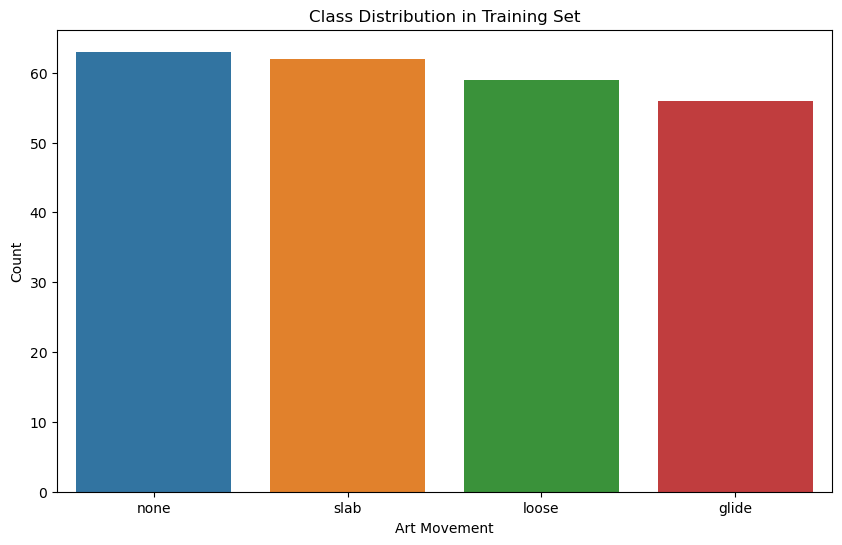

In [66]:
# Convert features and labels to DataFrame
# Exclude vgg from feature analysis
feature_columns = [f"feature_{i}" for i in range(X_train.shape[1])]
df_features = pd.DataFrame(X_train, columns=feature_columns)
df_labels = pd.DataFrame(y_train, columns=["label"])
df = pd.concat([df_features, df_labels], axis=1)

print('Train Dataframe Head, First 5 images:\n')
print(df.head())

# Summarize Data
print("Train Data Summary:\n")
print(df.describe())


# Visualize class distribution 
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='label')
plt.title('Class Distribution in Training Set')
plt.xlabel('Art Movement')
plt.ylabel('Count')
plt.show()


## Explore Feature importance & Select Top Features
Excluding vgg until very end

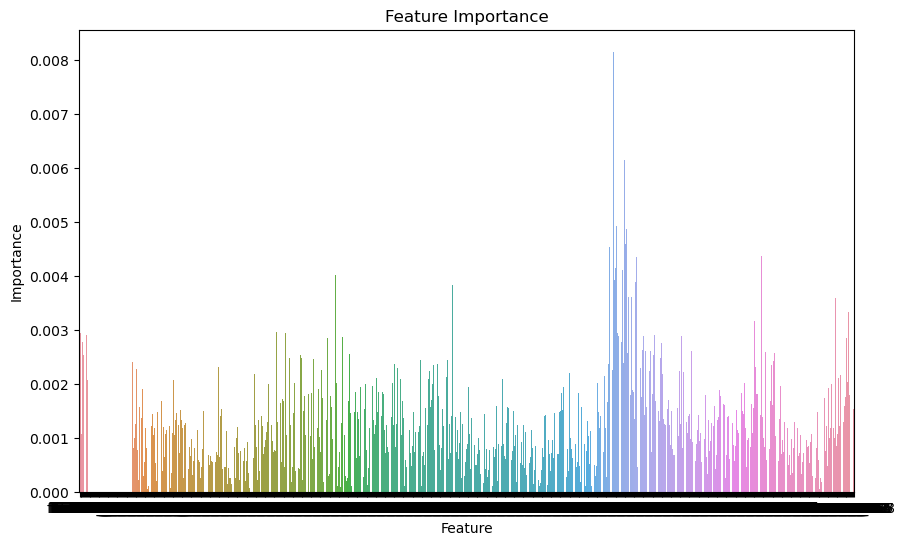

In [67]:
# Explore feature importance (testing using random forest classifier)
X_explore = df.drop('label', axis=1)
y_explore = df['label']
rf = RandomForestClassifier()
rf.fit(X_explore, y_explore)
feature_importance = rf.feature_importances_

plt.figure(figsize=(10, 6))
sns.barplot(x=feature_columns, y=feature_importance)
plt.title('Feature Importance')
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.show()

In [68]:
# Select top features based on importance scores
top_feature_indices_asc = (np.argsort(feature_importance))[-100:]
top_feature_indices = top_feature_indices_asc[::-1] #reversing order so most imptt feature is first
top_feature_columns = [feature_columns[i] for i in top_feature_indices]
top_feature_importance = feature_importance[top_feature_indices]

X_train_top_features = X_train[:, top_feature_indices]
X_val_top_features = X_val[:, top_feature_indices]
X_test_top_features = X_test[:, top_feature_indices]

[592 604 600 595 606 609 605 587 756 617 594 602 284 764 593 616 413 220
 612 608 838 385 753 852 598 292 748 588 303 762 599 712 218 228 596   1
 620   8 637 667 625 597 291 275 850 230   3 601 645 590 589 624 633 627
 678 242 760 607 770 299 245   4 636 856 644 246 233 281 415 259 129 378
 408 769   6 844  59 603 691 397 586 349 373 767 392  58 749 154 622 221
 352  63 591 268 721 388 665 632 669 543]


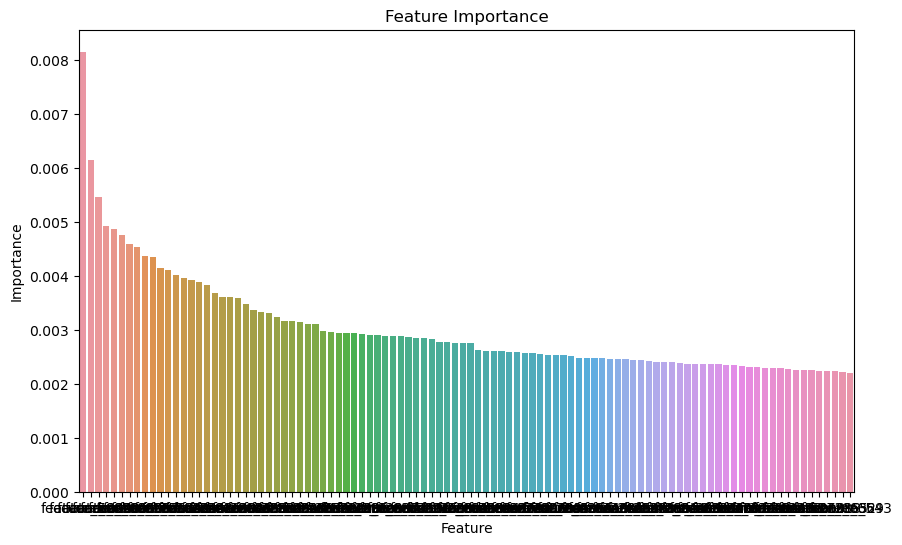

In [69]:
# Understand what the top features represent
# Remember: 
        # Lbp_features: [0:58]
        # HSV features: [58:314], [314:570],[570:826]
        # RBG features: [826:829]
        # FFT features: [829:859] 
        # VGG features: [859:] 25088 features
print(top_feature_indices)

plt.figure(figsize=(10, 6))
sns.barplot(x=top_feature_columns, y=top_feature_importance)
plt.title('Feature Importance')
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.show()

## Random Forest Classifier & Results 
With TOP Features, no VGG

In [70]:
# Train a classifier (RandomForestClassifier) on the training dataset with top features and evaluate on the validation set
rf_top = RandomForestClassifier()
rf_top.fit(X_train_top_features, y_train)
y_pred_val = rf_top.predict(X_val_top_features)
print("Classification Report with Top Features:")
print(classification_report(y_val, y_pred_val))
print("Accuracy with Top Features:", accuracy_score(y_val, y_pred_val))

Classification Report with Top Features:
              precision    recall  f1-score   support

       glide       0.42      0.41      0.42        27
       loose       0.45      0.38      0.41        24
        none       0.29      0.47      0.36        15
        slab       0.20      0.14      0.17        14

    accuracy                           0.36        80
   macro avg       0.34      0.35      0.34        80
weighted avg       0.37      0.36      0.36        80

Accuracy with Top Features: 0.3625


#### Evaluate on Test Data

In [71]:
# Assess accuracy of model on test data
test_predictions = rf_top.predict(X_test_top_features)
test_accuracy = accuracy_score(y_test, test_predictions)

print("Classification Report with Top Features:")
print(classification_report(y_test, test_predictions))
print("Accuracy with Top Features:", accuracy_score(y_test, test_predictions))

Classification Report with Top Features:
              precision    recall  f1-score   support

       glide       0.26      0.29      0.28        17
       loose       0.30      0.53      0.38        17
        none       0.42      0.23      0.29        22
        slab       0.47      0.38      0.42        24

    accuracy                           0.35        80
   macro avg       0.36      0.36      0.34        80
weighted avg       0.38      0.35      0.35        80

Accuracy with Top Features: 0.35


#### ROC Curve

In [72]:
# Get predicted probabilities for each class on the validation set
y_score_val = rf_top.predict_proba(X_val_top_features)

In [73]:
# Binarize the labels
y_val_binarized = label_binarize(y_val, classes=['glide','loose','none','slab'])
n_classes = y_val_binarized.shape[1]

In [74]:
classes=['glide','loose','none','slab']

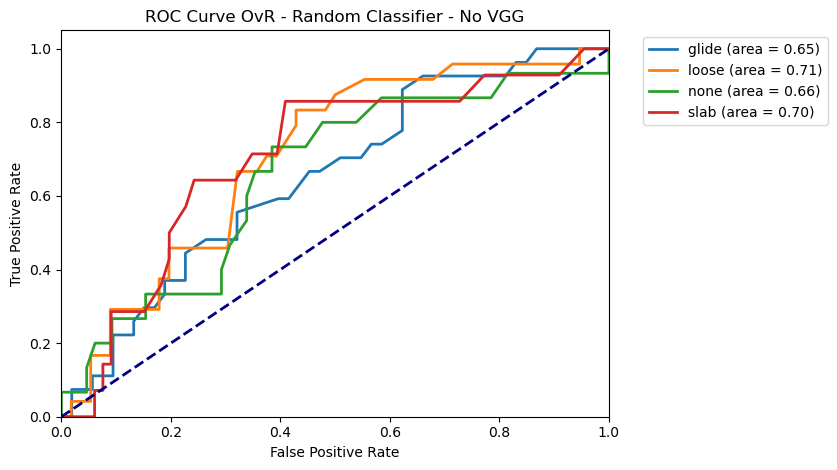

In [75]:
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_val_binarized[:, i], y_score_val[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label='{} (area = {:0.2f})'.format(classes[i], roc_auc))

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve OvR - Random Classifier - No VGG')
plt.tight_layout()
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.show()


Classification Report:
              precision    recall  f1-score   support

       glide       0.42      0.41      0.42        27
       loose       0.45      0.38      0.41        24
        none       0.29      0.47      0.36        15
        slab       0.20      0.14      0.17        14

    accuracy                           0.36        80
   macro avg       0.34      0.35      0.34        80
weighted avg       0.37      0.36      0.36        80



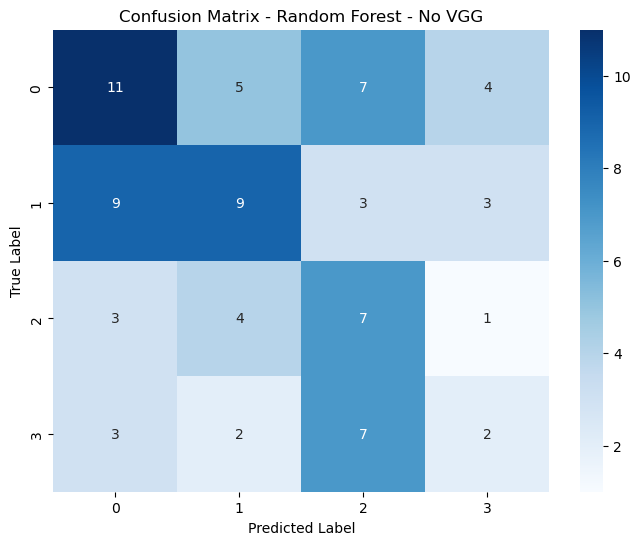

In [76]:
conf_matrix = confusion_matrix(y_val, y_pred_val)

# Classification report
print("Classification Report:")
print(classification_report(y_val, y_pred_val))


# Convert confusion matrix to DataFrame for better visualization
conf_df = pd.DataFrame(conf_matrix, index=range(len(conf_matrix)), columns=range(len(conf_matrix)))

# Create a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(conf_df, annot=True, fmt="d", cmap="Blues")
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix - Random Forest - No VGG')
plt.show()


## Logistic Regression Classifier & Results 
With TOP Features, no VGG

In [77]:
logistic_model = LogisticRegression(max_iter=1000)


param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],  
    'penalty': ['l2'],  
    'solver': ['liblinear']  
}


# Perform grid search to find the best hyperparameters
grid_search = GridSearchCV(logistic_model, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train_top_features, y_train)

# Get the best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

Best Hyperparameters: {'C': 100, 'penalty': 'l2', 'solver': 'liblinear'}


In [78]:
best_logistic_model = LogisticRegression(C=best_params['C'], penalty=best_params['penalty'], max_iter=10000)

# Train the model on training data
best_logistic_model.fit(X_train_top_features, y_train)

# Predict labels for validation data
y_pred_val = best_logistic_model.predict(X_val_top_features)

# Calculate accuracy on validation data
accuracy_validation = accuracy_score(y_val, y_pred_val)
print("Accuracy on Validation Data:", accuracy_validation)

Accuracy on Validation Data: 0.375


In [79]:
y_pred_test = best_logistic_model.predict(X_test_top_features)

# Calculate accuracy on test data
accuracy_test = accuracy_score(y_test, y_pred_test)
print("Accuracy on Test Data:", accuracy_test)

Accuracy on Test Data: 0.4875


#### ROC Curve

In [80]:
# Get predicted probabilities for each class on the validation set
y_score_val = best_logistic_model.predict_proba(X_val_top_features)

In [81]:
# Binarize the labels
y_val_binarized = label_binarize(y_val, classes=['glide','loose','none','slab'])
n_classes = y_val_binarized.shape[1]

In [82]:
classes=['glide','loose','none','slab']

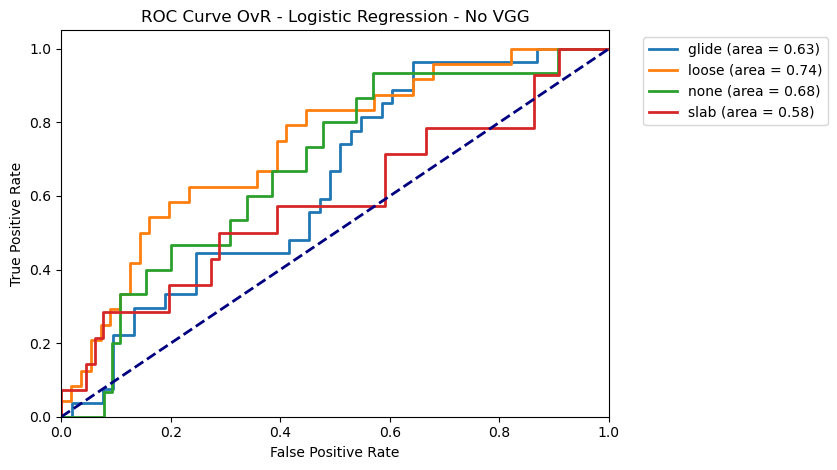

In [83]:
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_val_binarized[:, i], y_score_val[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label='{} (area = {:0.2f})'.format(classes[i], roc_auc))

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve OvR - Logistic Regression - No VGG')
plt.tight_layout()
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.show()

Confusion Matrix

Classification Report:
              precision    recall  f1-score   support

       glide       0.47      0.26      0.33        27
       loose       0.58      0.29      0.39        24
        none       0.33      0.60      0.43        15
        slab       0.27      0.50      0.35        14

    accuracy                           0.38        80
   macro avg       0.41      0.41      0.38        80
weighted avg       0.44      0.38      0.37        80



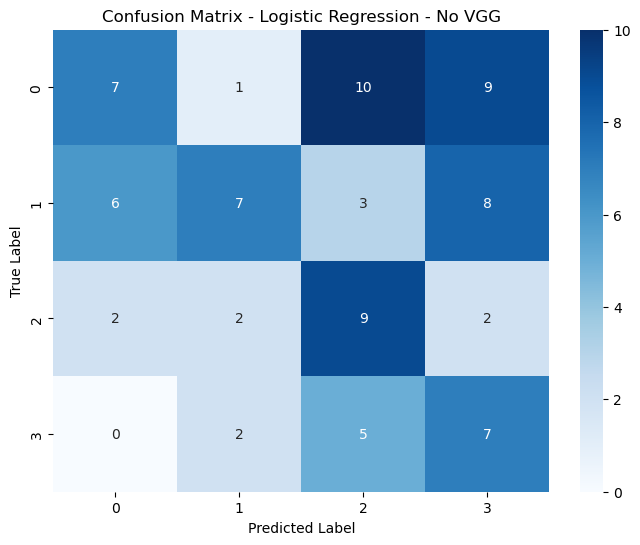

In [84]:
conf_matrix = confusion_matrix(y_val, y_pred_val)

# Classification report
print("Classification Report:")
print(classification_report(y_val, y_pred_val))


# Convert confusion matrix to DataFrame for better visualization
conf_df = pd.DataFrame(conf_matrix, index=range(len(conf_matrix)), columns=range(len(conf_matrix)))

# Create a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(conf_df, annot=True, fmt="d", cmap="Blues")
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix - Logistic Regression - No VGG')
plt.show()


## Random Forest
With VGG now

In [85]:
# Train a classifier (RandomForestClassifier) on the training dataset with top features and evaluate on the validation set
rf_top = RandomForestClassifier()
rf_top.fit(X_train_vgg, y_train_vgg)
y_pred_val = rf_top.predict(X_val_vgg)
print("Classification Report with Top Features:")
print(classification_report(y_val_vgg, y_pred_val))
print("Accuracy with Top Features:", accuracy_score(y_val_vgg, y_pred_val))

Classification Report with Top Features:
              precision    recall  f1-score   support

       glide       0.63      0.44      0.52        27
       loose       0.58      0.46      0.51        24
        none       0.26      0.53      0.35        15
        slab       0.36      0.29      0.32        14

    accuracy                           0.44        80
   macro avg       0.46      0.43      0.43        80
weighted avg       0.50      0.44      0.45        80

Accuracy with Top Features: 0.4375


In [86]:
# Assess accuracy of model on test data
test_predictions = rf_top.predict(X_test_vgg)
test_accuracy = accuracy_score(y_test_vgg, test_predictions)

print("Classification Report with Top Features:")
print(classification_report(y_test, test_predictions))
print("Accuracy with Top Features:", accuracy_score(y_test_vgg, test_predictions))

Classification Report with Top Features:
              precision    recall  f1-score   support

       glide       0.25      0.24      0.24        17
       loose       0.44      0.65      0.52        17
        none       0.41      0.41      0.41        22
        slab       0.59      0.42      0.49        24

    accuracy                           0.42        80
   macro avg       0.42      0.43      0.42        80
weighted avg       0.44      0.42      0.42        80

Accuracy with Top Features: 0.425


### ROC Curve

In [87]:
# Get predicted probabilities for each class on the validation set
y_score_val = rf_top.predict_proba(X_val_vgg)

In [88]:
# Binarize the labels
y_val_binarized = label_binarize(y_val_vgg, classes=['glide','loose','none','slab'])
n_classes = y_val_binarized.shape[1]

In [89]:
classes=['glide','loose','none','slab']

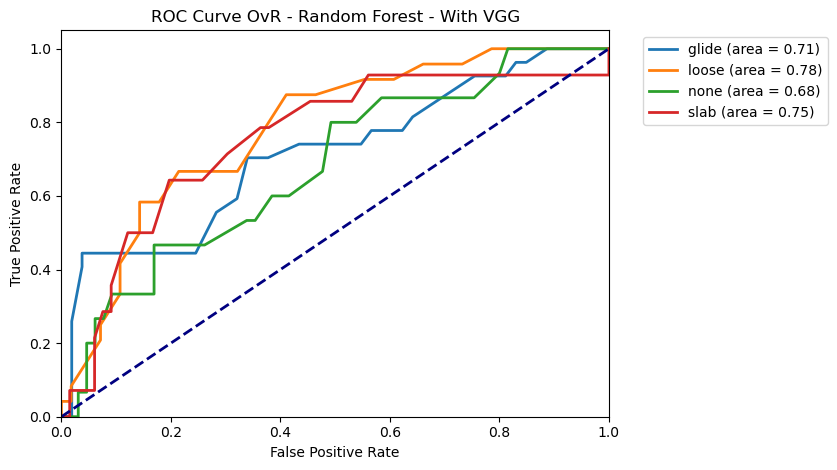

In [90]:
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_val_binarized[:, i], y_score_val[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label='{} (area = {:0.2f})'.format(classes[i], roc_auc))

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve OvR - Random Forest - With VGG')
plt.tight_layout()
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.show()

Confusion Matrix

Classification Report:
              precision    recall  f1-score   support

       glide       0.63      0.44      0.52        27
       loose       0.58      0.46      0.51        24
        none       0.26      0.53      0.35        15
        slab       0.36      0.29      0.32        14

    accuracy                           0.44        80
   macro avg       0.46      0.43      0.43        80
weighted avg       0.50      0.44      0.45        80



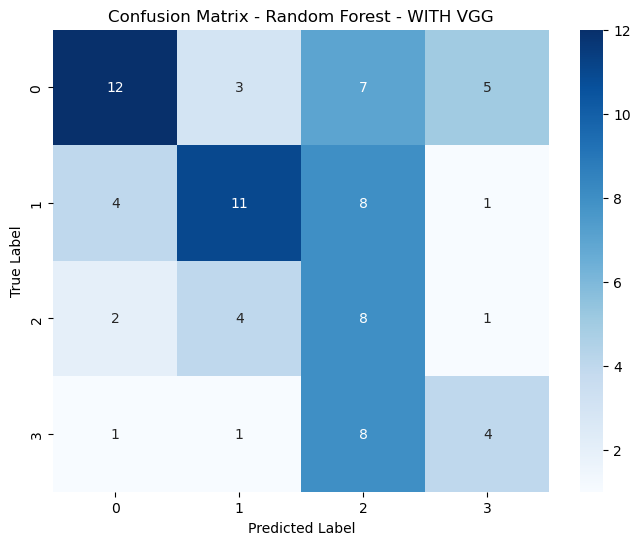

In [91]:
conf_matrix = confusion_matrix(y_val_vgg, y_pred_val)

# Classification report
print("Classification Report:")
print(classification_report(y_val_vgg, y_pred_val))


# Convert confusion matrix to DataFrame for better visualization
conf_df = pd.DataFrame(conf_matrix, index=range(len(conf_matrix)), columns=range(len(conf_matrix)))

# Create a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(conf_df, annot=True, fmt="d", cmap="Blues")
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix - Random Forest - WITH VGG')
plt.show()


## Logistic Regression Classifier & Results 
With VGG

In [92]:
logistic_model = LogisticRegression(max_iter=1000)


param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],  
    'penalty': ['l2'],  
    'solver': ['liblinear']  
}


# Perform grid search to find the best hyperparameters
grid_search = GridSearchCV(logistic_model, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train_vgg, y_train_vgg)

# Get the best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

Best Hyperparameters: {'C': 0.01, 'penalty': 'l2', 'solver': 'liblinear'}


In [93]:
best_logistic_model = LogisticRegression(C=best_params['C'], penalty=best_params['penalty'], max_iter=10000)

# Train the model on training data
best_logistic_model.fit(X_train_vgg, y_train_vgg)

# Predict labels for validation data
y_pred_val = best_logistic_model.predict(X_val_vgg)

# Calculate accuracy on validation data
accuracy_validation = accuracy_score(y_val_vgg, y_pred_val)
print("Accuracy on Validation Data:", accuracy_validation)

Accuracy on Validation Data: 0.5125


In [94]:
y_pred_test = best_logistic_model.predict(X_test_vgg)

# Calculate accuracy on test data
accuracy_test = accuracy_score(y_test_vgg, y_pred_test)
print("Accuracy on Test Data:", accuracy_test)

Accuracy on Test Data: 0.4375


### ROC Curve

In [95]:
# Get predicted probabilities for each class on the validation set
y_score_val = best_logistic_model.predict_proba(X_val_vgg)

In [96]:
# Binarize the labels
y_val_binarized = label_binarize(y_val_vgg, classes=['glide','loose','none','slab'])
n_classes = y_val_binarized.shape[1]

In [97]:
classes=['glide','loose','none','slab']

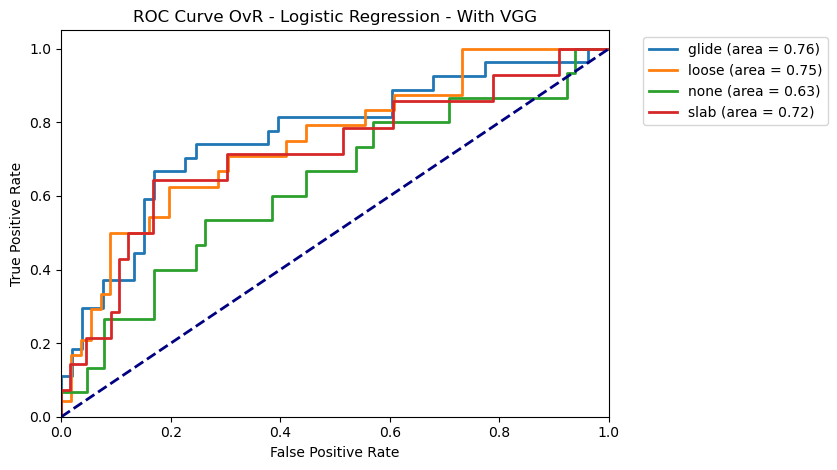

In [98]:
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_val_binarized[:, i], y_score_val[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label='{} (area = {:0.2f})'.format(classes[i], roc_auc))

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve OvR - Logistic Regression - With VGG')
plt.tight_layout()
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.show()

Confusion Matrix

Classification Report:
              precision    recall  f1-score   support

       glide       0.62      0.56      0.59        27
       loose       0.60      0.50      0.55        24
        none       0.35      0.47      0.40        15
        slab       0.44      0.50      0.47        14

    accuracy                           0.51        80
   macro avg       0.50      0.51      0.50        80
weighted avg       0.53      0.51      0.52        80



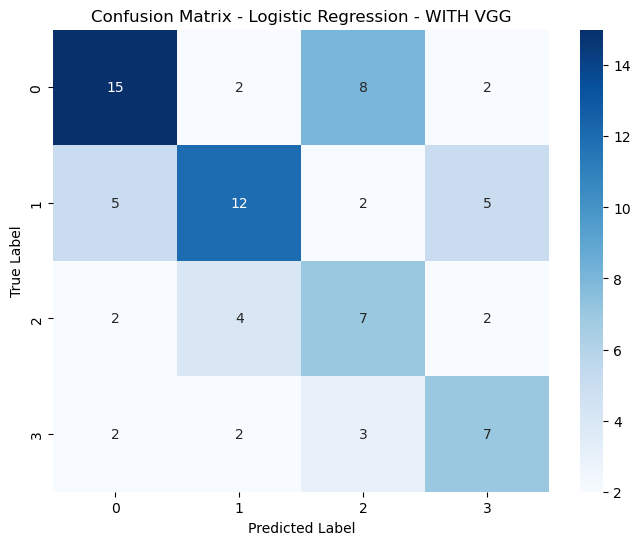

In [99]:
conf_matrix = confusion_matrix(y_val_vgg, y_pred_val)

# Classification report
print("Classification Report:")
print(classification_report(y_val_vgg, y_pred_val))


# Convert confusion matrix to DataFrame for better visualization
conf_df = pd.DataFrame(conf_matrix, index=range(len(conf_matrix)), columns=range(len(conf_matrix)))

# Create a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(conf_df, annot=True, fmt="d", cmap="Blues")
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix - Logistic Regression - WITH VGG')
plt.show()

## Visualize w/ tSNE

In [100]:
# Convert string labels to numerical values
label_encoder = LabelEncoder()
y_numerical = label_encoder.fit_transform(y_train)
y_num_labels = ['glide','loose','none','slab']
print(y_numerical[0:5])
print(y_train[0:5])

[2 3 3 1 2]
['none' 'slab' 'slab' 'loose' 'none']


C:\Users\mandy\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\mandy\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


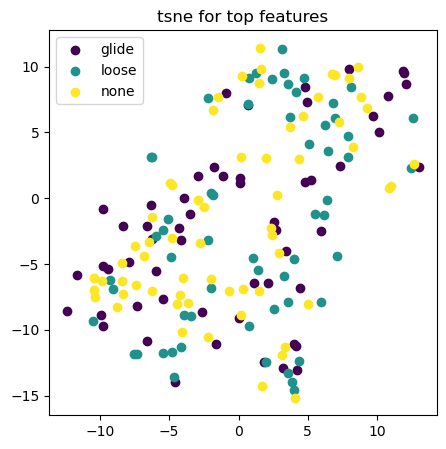

In [101]:
##### Top Features ######
# dimensionality reduction
tsne = TSNE(n_components=2, random_state=0)
X    = tsne.fit_transform(X_train[:,top_feature_indices]) # 2D representation
y    = range(3) # labels for visual

# visualize
fig = plt.figure(figsize=(5, 5))
viridis = cm.get_cmap('viridis')
colors  = np.linspace(0,1,3)
for i,c,l in zip(y, colors, y_num_labels): 
    plt.scatter( X[y_numerical==i,0], 
                 X[y_numerical==i,1], 
                 color=viridis(c), label=l )
plt.title('tsne for top features')
plt.legend()
plt.show()

C:\Users\mandy\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\mandy\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


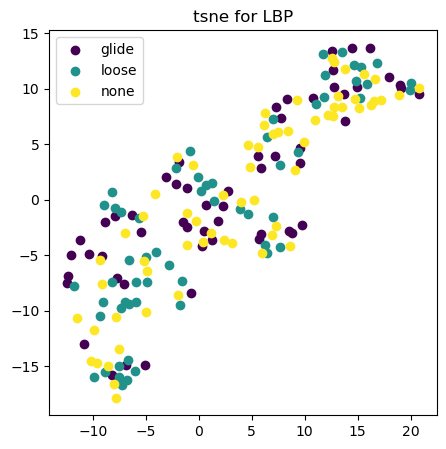

In [102]:
##### LBP ######
# dimensionality reduction
tsne = TSNE(n_components=2, random_state=0)
X    = tsne.fit_transform(X_train[:,0:58]) # 2D representation
y    = range(3) # labels for visual

# visualize
plt.figure(figsize=(5, 5))

viridis = cm.get_cmap('viridis')
colors  = np.linspace(0,1,3)
for i,c,l in zip(y, colors, y_num_labels):
    plt.scatter( X[y_numerical==i,0], 
                 X[y_numerical==i,1], 
                 color=viridis(c), label=l )
plt.title('tsne for LBP')
plt.legend()
plt.show()

C:\Users\mandy\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\mandy\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


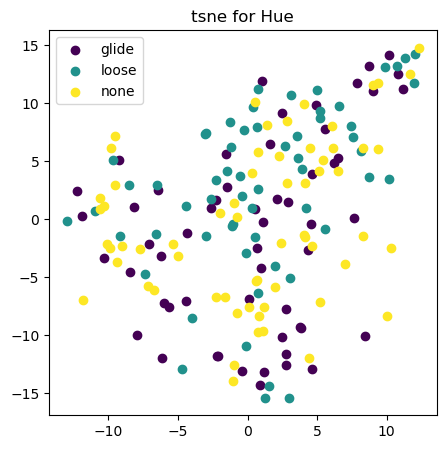

In [103]:
##### Hue ######
# dimensionality reduction
tsne = TSNE(n_components=2, random_state=0)
X    = tsne.fit_transform(X_train[:,58:314]) # 2D representation
y    = range(3) # labels for visual

# visualize
plt.figure(figsize=(5, 5))

viridis = cm.get_cmap('viridis')
colors  = np.linspace(0,1,3)
for i,c,l in zip(y, colors, y_num_labels): ##### TODO assign actual names
    plt.scatter( X[y_numerical==i,0], 
                 X[y_numerical==i,1], 
                 color=viridis(c), label=l )
plt.title('tsne for Hue')
plt.legend()
plt.show()

C:\Users\mandy\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\mandy\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


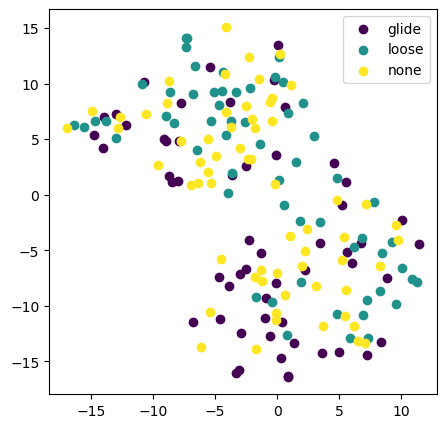

In [104]:
##### Saturation ######
# dimensionality reduction
tsne = TSNE(n_components=2, random_state=0)
X    = tsne.fit_transform(X_train[:,314:570]) # 2D representation
y    = range(3) # labels for visual

# visualize
plt.figure(figsize=(5, 5))

viridis = cm.get_cmap('viridis')
colors  = np.linspace(0,1,3)
for i,c,l in zip(y, colors, y_num_labels): ##### TODO assign actual names
    plt.scatter( X[y_numerical==i,0], 
                 X[y_numerical==i,1], 
                 color=viridis(c), label=l )
plt.legend()
plt.show()

C:\Users\mandy\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\mandy\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


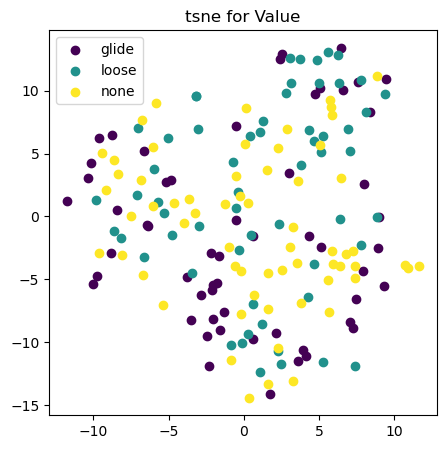

In [105]:
##### Value ######
# dimensionality reduction
tsne = TSNE(n_components=2, random_state=0)
X    = tsne.fit_transform(X_train[:,570:826]) # 2D representation
y    = range(3) # labels for visual

# visualize
plt.figure(figsize=(5, 5))

viridis = cm.get_cmap('viridis')
colors  = np.linspace(0,1,3)
for i,c,l in zip(y, colors, y_num_labels): ##### TODO assign actual names
    plt.scatter( X[y_numerical==i,0], 
                 X[y_numerical==i,1], 
                 color=viridis(c), label=l )
plt.title('tsne for Value')
plt.legend()
plt.show()

C:\Users\mandy\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\mandy\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


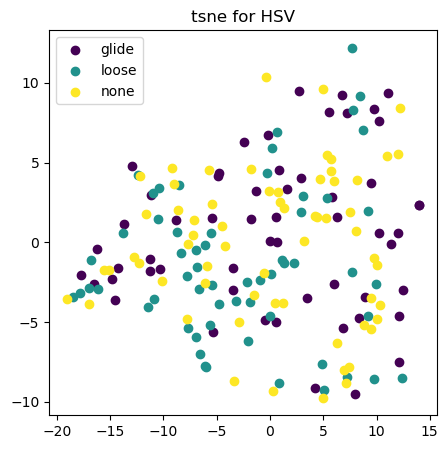

In [106]:
##### HSV ######
# dimensionality reduction
tsne = TSNE(n_components=2, random_state=0)
X    = tsne.fit_transform(X_train[:,58:826]) # 2D representation
y    = range(3) # labels for visual

# visualize
plt.figure(figsize=(5, 5))

viridis = cm.get_cmap('viridis')
colors  = np.linspace(0,1,3)
for i,c,l in zip(y, colors, y_num_labels): ##### TODO assign actual names
    plt.scatter( X[y_numerical==i,0], 
                 X[y_numerical==i,1], 
                 color=viridis(c), label=l )
plt.title('tsne for HSV')
plt.legend()
plt.show()

C:\Users\mandy\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\mandy\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


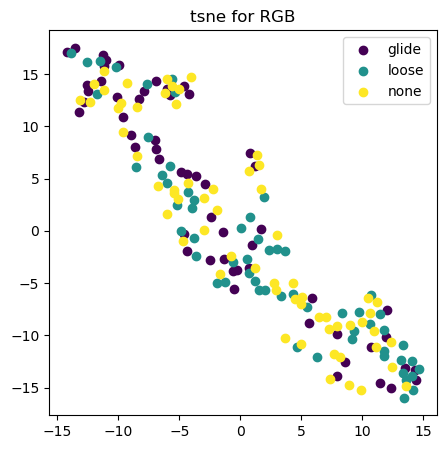

In [107]:
##### RGB ######
# dimensionality reduction
tsne = TSNE(n_components=2, random_state=0)
X    = tsne.fit_transform(X_train[:,826:829]) # 2D representation
y    = range(3) # labels for visual

# visualize
plt.figure(figsize=(5, 5))

viridis = cm.get_cmap('viridis')
colors  = np.linspace(0,1,3)
for i,c,l in zip(y, colors, y_num_labels):
    plt.scatter( X[y_numerical==i,0], 
                 X[y_numerical==i,1], 
                 color=viridis(c), label=l )
plt.title('tsne for RGB')
plt.legend()
plt.show()

C:\Users\mandy\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\mandy\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


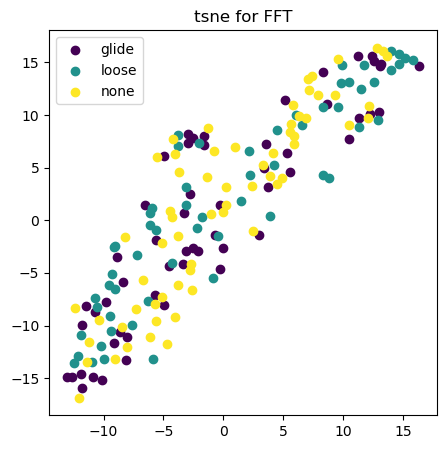

In [108]:
##### FFT ######
# dimensionality reduction
tsne = TSNE(n_components=2, random_state=0)
X    = tsne.fit_transform(X_train[:,829:]) # 2D representation
y    = range(3) # labels for visual

# visualize
plt.figure(figsize=(5, 5))

viridis = cm.get_cmap('viridis')
colors  = np.linspace(0,1,3)
for i,c,l in zip(y, colors, y_num_labels):
    plt.scatter( X[y_numerical==i,0], 
                 X[y_numerical==i,1], 
                 color=viridis(c), label=l )
plt.title('tsne for FFT')
plt.legend()
plt.show()

# PCA

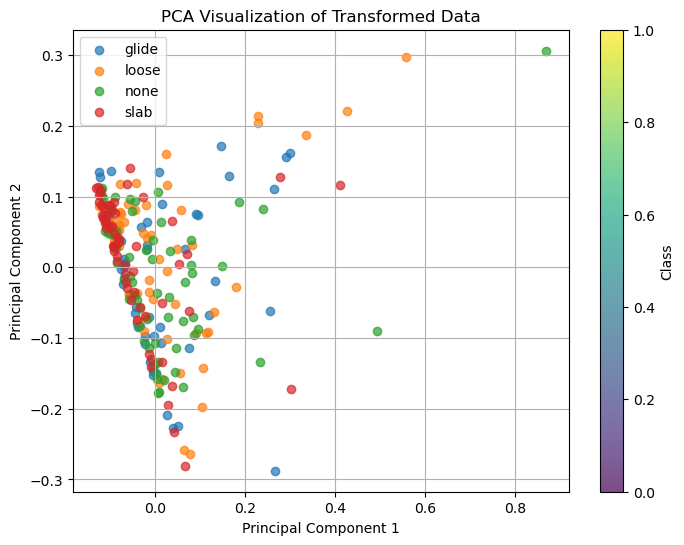

In [109]:
pca = PCA(n_components=2)
#Check to see which X_train to use. X_train_top_features for no VGG, or use VGG X_train?
#X_train_pca = pca.fit_transform(X_train)
X_train_pca = pca.fit_transform(X_train_top_features)
# Convert string labels to integer labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
cmap = plt.cm.get_cmap('viridis', len(np.unique(y_train_encoded)))
plt.figure(figsize=(8, 6))
for i, class_label in enumerate(np.unique(y_train_encoded)):
    plt.scatter(X_train_pca[y_train_encoded == class_label, 0],
                X_train_pca[y_train_encoded == class_label, 1],
                label=label_encoder.classes_[class_label],
                cmap=cmap,
                alpha=0.7)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Visualization of Transformed Data')
plt.colorbar(label='Class')
plt.legend()
plt.grid(True)
plt.show()